# Sprint 2
by Anne-Sophie Howard

In [1]:
# data science
import numpy as np

# single cell libraries
import pandas as pd
import scanpy as sc
import anndata as ad
import leidenalg
# Those libraires are for future work that I am planning to implement for sprint 3
# import igraph as ig
# import scalex 
# from scalex import SCALEX, label_transfer
# from scalex.plot import embedding

# cell annotation I will implement this library for sprint 3
import cello

# Visualization
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches 
import seaborn as sns

# Read mtx files
from scipy.io import mmread
from scipy.sparse import csr_matrix
# Z-score to p_values
# import scipy.stats

#Reading files in a row
import os
import glob

# Comparing string with regular expression
import re

In [2]:
# checking python version
import sys
print(sys.version)

3.8.18 (default, Sep 11 2023, 13:39:12) [MSC v.1916 64 bit (AMD64)]


In [3]:
# verifying that the notebook is running from the right kernel
sys.executable

'C:\\Users\\annes\\anaconda3\\envs\\single_cell_env\\python.exe'

In [4]:
sc.settings.verbosity = 3
sc.settings.set_figure_params(dpi=80, facecolor='white',figsize=(5,4),frameon=True)
sc.logging.print_header()
plt.rcParams['axes.unicode_minus']=False

scanpy==1.9.6 anndata==0.9.2 umap==0.5.5 numpy==1.24.4 scipy==1.10.1 pandas==2.0.3 scikit-learn==1.3.2 statsmodels==0.14.0 igraph==0.10.8 pynndescent==0.5.11


# Lymphoma dataset
In this project, I aim to use unsupervised classification from different blood samples, malignant and nonmalignant, to describe the biological status of other lymphoma more finely. Here, we focus on the heterogeneity of non-Hodgkin B-cell lymphoma, which originates in the Germinal Center reaction. In this dataset, we have four samples of reactive lymph nodes (nonmalignant samples), 4 Follicular lymphomas (slow-evolving lymphoma), 2 transformed follicular lymphomas (initially classified as follicular lymphoma, cancer became a more aggressive fast-growing cancer), and 3 DLBCL (fast-growing lymphoma).

In spring 2, I will pursue the analysis of the dataset by looking into all the samples and running some exploratory data analysis. I will then run some clustering methods on one sample (using the Louvain algorithm and the UMAP dimension reduction) and try to integrate two samples with the same method.

In [5]:
# Read the description file
sample_sheet_df = pd.read_csv("data_FL\AnnotationCells.csv", delimiter = ";")

In [6]:
sample_sheet_df.head()

,Sample,Barcode,Population
0,DLBCL1,AAACCTGAGCCATCGC,MalignantB
1,DLBCL1,AAACCTGAGCCTTGAT,MalignantB
2,DLBCL1,AAACCTGGTTAAGATG,MalignantB
3,DLBCL1,AAACCTGGTTAAGGGC,MalignantB
4,DLBCL1,AAACCTGTCATTTGGG,MalignantB


In [7]:
sample_sheet_df.shape

(26594, 3)

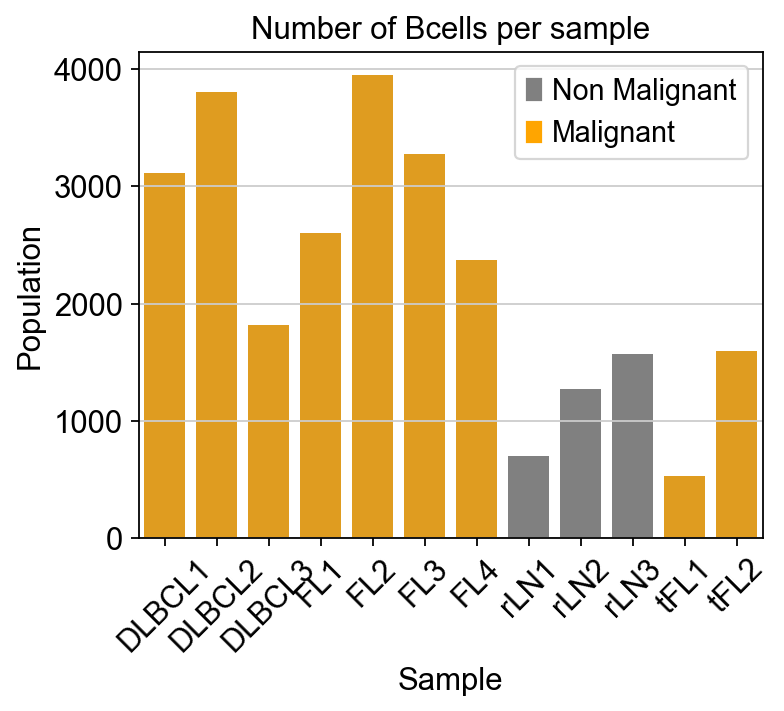

In [8]:
# We differentiate the malignant and non malignant samples
cell_number_df = sample_sheet_df.groupby('Sample')['Population'].count().reset_index()

cols = ['grey' if ((x == "rLN1" )| (x== "rLN2" )| (x == "rLN3")) else 'orange' for x in cell_number_df['Sample']]

plt.figure()
sns.barplot(x = 'Sample',
            y = 'Population',
            data = cell_number_df,
            palette = cols
            )
plt.xticks(rotation = 45)
pop_a = mpatches.Patch(color = 'grey', label = 'Non Malignant')
pop_b = mpatches.Patch(color = 'orange', label = 'Malignant')
plt.legend(handles = [pop_a,pop_b])
plt.title('Number of Bcells per sample')
plt.show()

In [9]:
# I want to check the status of each cell in each sample. id : are all cells malignant in DLBCL?
cell_type_df = sample_sheet_df.groupby(['Sample', 'Population'])['Barcode'].count().reset_index()
cell_type_df = cell_type_df.rename(columns ={'Barcode': 'Number_of_cells'})
cell_type_df

,Sample,Population,Number_of_cells
0,DLBCL1,MalignantB,3114
1,DLBCL2,MalignantB,3779
2,DLBCL2,Myeloid,26
3,DLBCL3,MalignantB,1798
4,DLBCL3,Myeloid,21
5,FL1,MalignantB,2597
6,FL2,MalignantB,3949
7,FL3,HealthyB,29
8,FL3,MalignantB,3221
9,FL3,Myeloid,22


I still need to determine where the 'Population' information comes from. Is it the result of some clustering or analysis of some gene expression?

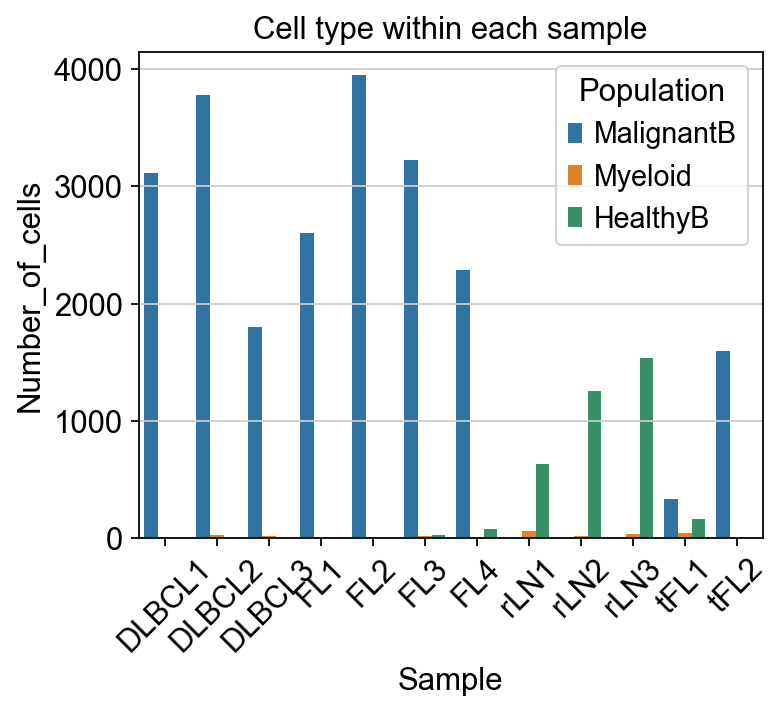

In [10]:
# Let's plot the type and number of cells within each sample
plt.figure()
sns.barplot(x = 'Sample',
            y = 'Number_of_cells',
            data = cell_type_df ,
            hue = 'Population'
            )
plt.xticks(rotation = 45)
plt.title('Cell type within each sample')
plt.show()

This graph shows that while some samples are from patients with lymphoma, some cells within the sample can be considered healthy and nonmalignant. The samples even contain some myeloid cells, a type of blood cell different from lymphocytes. Lymphocytes are the type of blood cells where the lymphoma takes their origin.

While we are interested in the gene expression of B cells (the malignant cells in non-B-cell lymphoma), looking at the T-cell population might also be interesting. T-cells are essential to the B-cell's activity in a healthy environment. It is reasonable to question whether they play a role in B-cell lymphoma (initiation, maintenance, or even transformation). This dataset contains some information about the T-cell population; we will try to include those in our analysis. We will first take a look at the repartition of the T-cell population.

In [11]:
# reading the file about T-cells
T_Cells_df = pd.read_csv('data_FL/Annotation_tcells.csv', delimiter = ";")

In [12]:
T_Cells_df.head()

,Barcode,Sample,Population
0,AAACGGGTCTTGACGA,tFL2,TTOX
1,AAAGCAAAGGCGCTCT,tFL2,TTOX
2,AAATGCCGTAGCACGA,tFL2,TTOX
3,AACCATGGTACCAGTT,tFL2,TTOX
4,AAGTCTGAGATGGCGT,tFL2,TTOX


In [13]:
# Let's take a look at the T-cells repartion between the sample
T_cell_group_df = T_Cells_df.groupby(['Sample', 'Population']).count()['Barcode'].reset_index()

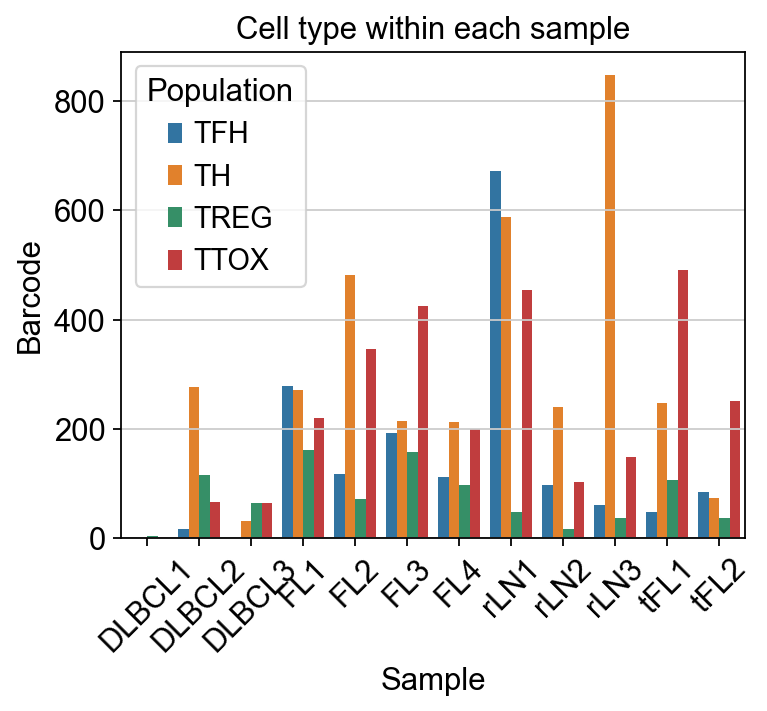

In [14]:
plt.figure()
sns.barplot(x = 'Sample',
            y = 'Barcode',
            data = T_cell_group_df ,
            hue = 'Population'
            )
plt.xticks(rotation = 45)
plt.title('Cell type within each sample')
plt.show()

This graph shows that four kinds of T-cells have been identified in this dataset, with a heterogeneous repartition of them among the different samples.

In [15]:
# I will now have a look at the first file rLN1
# Each sample contains 3 files

In [16]:
# a genes.tsv file
rLN1_genes_df = pd.read_csv ("data_FL/rLN1/genes.tsv", sep = '\t', header = None)

In [17]:
var = rLN1_genes_df
var = var.loc[:,:2]
var.index.name = 'Gene Name'
var.columns = ['EnsemblId','gene_ids']
var

,EnsemblId,gene_ids
Gene Name,,
0,ENSG00000243485,RP11-34P13.3
1,ENSG00000237613,FAM138A
2,ENSG00000186092,OR4F5
3,ENSG00000238009,RP11-34P13.7
4,ENSG00000239945,RP11-34P13.8
...,...,...
33689,ENSG00000277856,AC233755.2
33690,ENSG00000275063,AC233755.1
33691,ENSG00000271254,AC240274.1


In [18]:
var.set_index('gene_ids', drop =False, inplace=True)

In [19]:
var.shape

(33694, 2)

In [20]:
var

,EnsemblId,gene_ids
gene_ids,,
RP11-34P13.3,ENSG00000243485,RP11-34P13.3
FAM138A,ENSG00000237613,FAM138A
OR4F5,ENSG00000186092,OR4F5
RP11-34P13.7,ENSG00000238009,RP11-34P13.7
RP11-34P13.8,ENSG00000239945,RP11-34P13.8
...,...,...
AC233755.2,ENSG00000277856,AC233755.2
AC233755.1,ENSG00000275063,AC233755.1
AC240274.1,ENSG00000271254,AC240274.1


In [21]:
var.index

Index(['RP11-34P13.3', 'FAM138A', 'OR4F5', 'RP11-34P13.7', 'RP11-34P13.8',
       'RP11-34P13.14', 'RP11-34P13.9', 'FO538757.3', 'FO538757.2',
       'AP006222.2',
       ...
       'AC007325.2', 'BX072566.1', 'AL354822.1', 'AC023491.2', 'AC004556.1',
       'AC233755.2', 'AC233755.1', 'AC240274.1', 'AC213203.1', 'FAM231B'],
      dtype='object', name='gene_ids', length=33694)

In [23]:
# a barcodes.tsv file
rLN1_barcodes_df = pd.read_csv ("data_FL/rLN1/barcodes.tsv", sep = '\t', header = None, index_col = 0)
rLN1_barcodes_df.index.name = 'barcode'
rLN1_barcodes_df
obs = rLN1_barcodes_df
obs

""
barcode
AAACCTGCAAGGCTCC-1
AAACCTGCAGGTCGTC-1
AAACCTGGTTCCACTC-1
AAACCTGTCTGATACG-1
AAACGGGAGCGGCTTC-1
...
TTTGTCAGTAAGTGTA-1
TTTGTCAGTTTAAGCC-1
TTTGTCATCGCCGTGA-1


In [24]:
obs.shape

(3095, 0)

In [25]:
# a matrix.mtx
rLN1_adata = sc.read_mtx("data_FL/rLN1/matrix.mtx", dtype='float32')
rLN1_adata = rLN1_adata.T.copy() # Without copy - downstream does not work correctly 
rLN1_adata

AnnData object with n_obs × n_vars = 3095 × 33694

In [26]:
rLN1_adata.var_names = var.index

In [27]:
rLN1_adata.var_names

Index(['RP11-34P13.3', 'FAM138A', 'OR4F5', 'RP11-34P13.7', 'RP11-34P13.8',
       'RP11-34P13.14', 'RP11-34P13.9', 'FO538757.3', 'FO538757.2',
       'AP006222.2',
       ...
       'AC007325.2', 'BX072566.1', 'AL354822.1', 'AC023491.2', 'AC004556.1',
       'AC233755.2', 'AC233755.1', 'AC240274.1', 'AC213203.1', 'FAM231B'],
      dtype='object', name='gene_ids', length=33694)

In [28]:
var

,EnsemblId,gene_ids
gene_ids,,
RP11-34P13.3,ENSG00000243485,RP11-34P13.3
FAM138A,ENSG00000237613,FAM138A
OR4F5,ENSG00000186092,OR4F5
RP11-34P13.7,ENSG00000238009,RP11-34P13.7
RP11-34P13.8,ENSG00000239945,RP11-34P13.8
...,...,...
AC233755.2,ENSG00000277856,AC233755.2
AC233755.1,ENSG00000275063,AC233755.1
AC240274.1,ENSG00000271254,AC240274.1


[ 41050.  41908.  42928.  43078.  46425.  46625.  47051.  47358.  47411.
  49224.  50040.  50448.  50858.  52534.  52590.  53780.  54591.  55100.
  55590.  56302.  56516.  56694.  57778.  59264.  59404.  60491.  63771.
  63947.  63973.  65711.  65810.  70035.  70244.  70383.  73686.  73994.
  75486.  78937.  83612.  85110.  89887.  89940.  91175.  93445.  94654.
  96384.  97180. 101330. 104668. 107356. 109385. 111006. 120783. 129180.
 131340. 168136. 169105. 276092. 359383. 555979.]


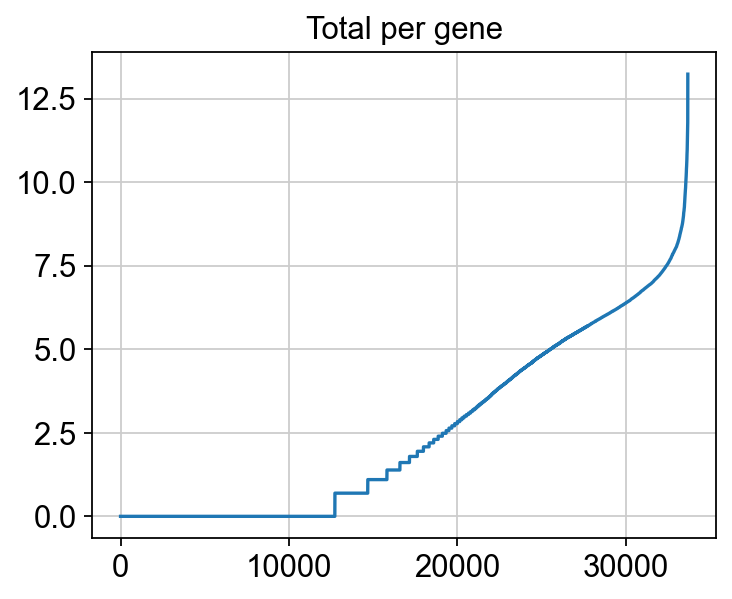

In [29]:
# we will take a look at the values in the matrix

# First take a look at the values in each row/cell 
v = rLN1_adata.X.sum(axis = 0)
v = np.sort(np.asarray(v).ravel() )
print(v[-60:])
plt.figure
plt.plot(np.log(1+v))
plt.title('Total per gene')
plt.show()

In [30]:
np.array(np.where(v == 0)).shape

(1, 12728)

[21173. 21221. 21322. 21414. 21484. 21591. 21710. 21796. 21913. 22193.
 22210. 22255. 22366. 22372. 22530. 22676. 23235. 23380. 23486. 23533.
 23730. 23731. 23801. 23805. 24400. 24635. 25176. 25268. 25593. 25861.
 26148. 26534. 26695. 26823. 27302. 27513. 27531. 27938. 28158. 28714.
 28896. 29710. 30335. 31729. 31826. 32417. 33363. 34793. 35129. 35567.
 37414. 37751. 38341. 39855. 42006. 49109. 49431. 49596. 50195. 70057.]


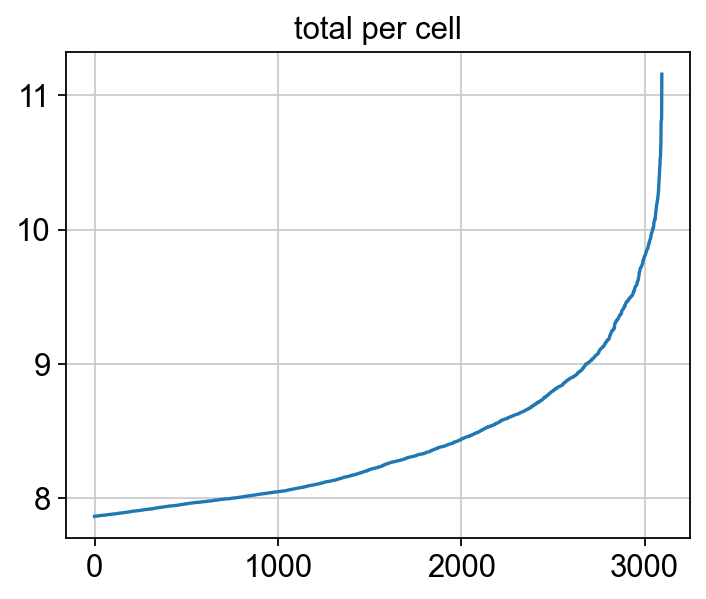

In [31]:
# then take a look at the values in each column/gene
v = rLN1_adata.X.sum(axis = 1)
v = np.sort(np.asarray(v).ravel() )
print(v[-60:])
plt.plot(np.log(1+v))
plt.title('total per cell')
plt.show()

In [32]:
rLN1_adata.obs = obs
rLN1_adata.var = var
rLN1_adata

AnnData object with n_obs × n_vars = 3095 × 33694
    var: 'EnsemblId', 'gene_ids'

In [33]:
rLN1_adata.var_names_make_unique()

The above analysis shows that the sample rLN1 contains 3095 entries (each one being a single cell) and 33694 features, each being a gene. The values are the expression level of each gene within a given cell.

I now have an Anndata object that I can use with the Scanpy library. Next, I will loop the work over all the files available in this dataset to finish the exploration data analysis.

In [34]:
def my_Anndata(main_folder_name):
    '''
    Create a dictionnary of an Anndata object from three different files. the key is the name of the sample and the value is the Anndat object
    
    Input: str, name of the main folder where the sub_folder containing the files of interest are located
    
    output: dictionnary with all Anndata objects    
    '''
    adata_dict = {}
    # Reading the 12 folders names
    directories_names = glob.glob(f"{main_folder_name}"+f"/*[0-9]")
    # Then loop over each folder
    for directories  in directories_names:
        
        # Then sparse the files within the folder
        files_names = glob.glob(f"{directories}/*")
        for file in files_names:
            
            # Getting the files in the directory that correspond to the matrix
            if re.match(".*(matrix.mtx)", file):
                
                # create the Anndata object
                adata = sc.read_mtx(file, dtype='float32')
                adata = adata.T.copy() # Without copy - downstream does not work correctly 
    
           
            # Getting the file with the features
            if re.match(".*((genes)|(features))(.tsv)", file):
                
                # store this file as the var attribute of the Anndata object
                genes_df = pd.read_csv (file, sep = '\t', header = None)
                genes_df = genes_df.loc[:,:1] # this is to only select the columns we are interrested in
                genes_df.columns = ['EnsemblId','gene_ids']
                genes_df.set_index('gene_ids', drop =False, inplace=True)
            
            # a barcodes.tsv file
            if re.match(".*(barcodes.tsv)", file):
                #store the file into the obs attribute of the annData
                barcodes_df = pd.read_csv (file, sep = '\t', header = None, index_col = 0)
                barcodes_df.index.name = 'barcode'
    
        # compiling info in the annadata file
        adata.obs = barcodes_df
        adata.var = genes_df
            
        adata_dict[re.search(r"(?<=\\)\w+", f"{directories}").group(0)] = adata
    return adata_dict

In [35]:
# Creating a dictinnary of the 12 samples of my dataset
adata_FL = my_Anndata('data_FL')

In [36]:
adata_FL

{'DLBCL1': AnnData object with n_obs × n_vars = 4212 × 33694
     var: 'EnsemblId', 'gene_ids',
 'DLBCL2': AnnData object with n_obs × n_vars = 5249 × 33694
     var: 'EnsemblId', 'gene_ids',
 'DLBCL3': AnnData object with n_obs × n_vars = 3109 × 33538
     var: 'EnsemblId', 'gene_ids',
 'FL1': AnnData object with n_obs × n_vars = 3690 × 33694
     var: 'EnsemblId', 'gene_ids',
 'FL2': AnnData object with n_obs × n_vars = 5107 × 33694
     var: 'EnsemblId', 'gene_ids',
 'FL3': AnnData object with n_obs × n_vars = 4705 × 33694
     var: 'EnsemblId', 'gene_ids',
 'FL4': AnnData object with n_obs × n_vars = 3220 × 33538
     var: 'EnsemblId', 'gene_ids',
 'rLN1': AnnData object with n_obs × n_vars = 3095 × 33694
     var: 'EnsemblId', 'gene_ids',
 'rLN2': AnnData object with n_obs × n_vars = 2119 × 33538
     var: 'EnsemblId', 'gene_ids',
 'rLN3': AnnData object with n_obs × n_vars = 2849 × 33538
     var: 'EnsemblId', 'gene_ids',
 'tFL1': AnnData object with n_obs × n_vars = 2071 × 33694

## Scanpy tutorial
The following code and comments are inspired by the scanpy tutorial:https://scanpy-tutorials.readthedocs.io/en/latest/pbmc3k.html#

In [37]:
# Let's run the scanpy tutorial on our dataset
sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')

scanpy==1.9.6 anndata==0.9.2 umap==0.5.5 numpy==1.24.4 scipy==1.10.1 pandas==2.0.3 scikit-learn==1.3.2 statsmodels==0.14.0 igraph==0.10.8 pynndescent==0.5.11


In [38]:
results_file = 'write/rLN1.h5ad'  # the file that will store the analysis results

### Preprocessing
I will run the code on one sample with a description and then loop the code over the 11 other samples.

Show those genes that yield the highest fraction of counts in each single cell across all cells.

normalizing counts per cell
    finished (0:00:00)


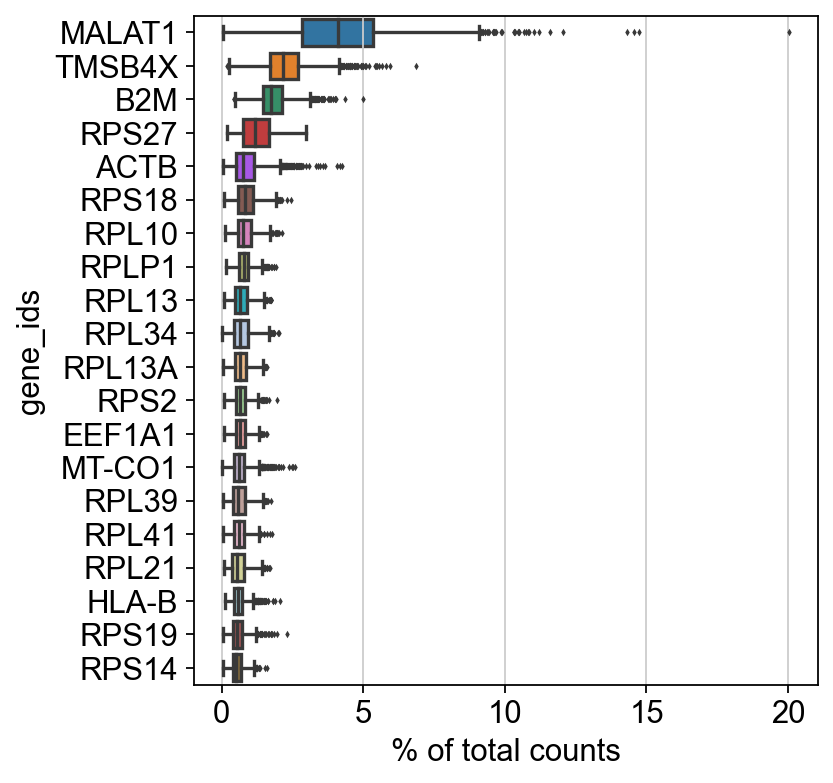

In [39]:
sc.pl.highest_expr_genes(rLN1_adata, n_top=20, gene_symbols = 'gene_ids')
# MALAT1 is a long non-coding RNA that might acts as a transcriptional regulator

In [40]:
# Let's apply some basic filtering
sc.pp.filter_cells(rLN1_adata, min_genes=200)

filtered out 15875 genes that are detected in less than 3 cells


In [ ]:
sc.pp.filter_genes(rLN1_adata, min_cells=3)

Let’s assemble some information about mitochondrial genes essential for quality control.
Citing from “Simple Single Cell” workflows (Lun, McCarthy & Marioni, 2017):
"High proportions indicate poor-quality cells (Islam et al. 2014; Ilicic et al. 2016), possibly because of loss of cytoplasmic RNA from perforated cells. The reasoning is that mitochondria are larger than individual transcript molecules and less likely to escape through tears in the cell membrane."

A violin plot of some of the computed quality measures:

- the number of genes expressed in the count matrix

- the total counts per cell

- the percentage of counts in mitochondrial genes

In [41]:
# With pp.calculate_qc_metrics, we can compute many metrics very efficiently.
rLN1_adata.var['mt'] = rLN1_adata.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(rLN1_adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

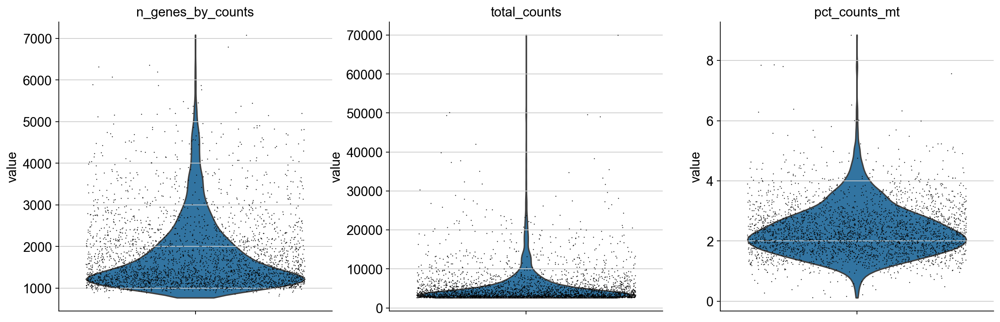

In [42]:
sc.pl.violin(rLN1_adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

Remove cells that have too many mitochondrial genes expressed or too many total counts:

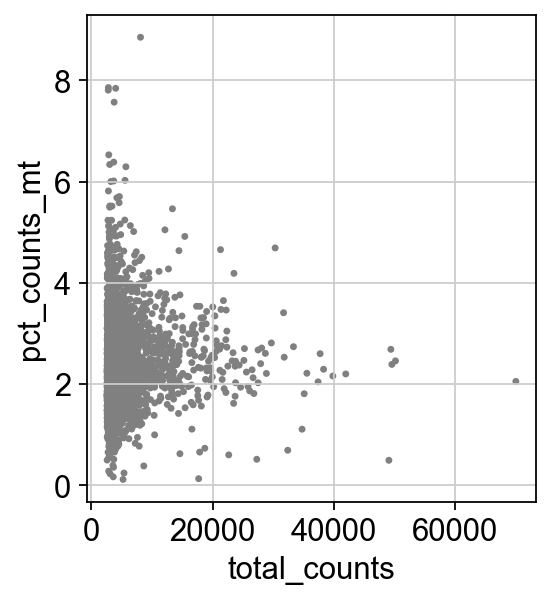

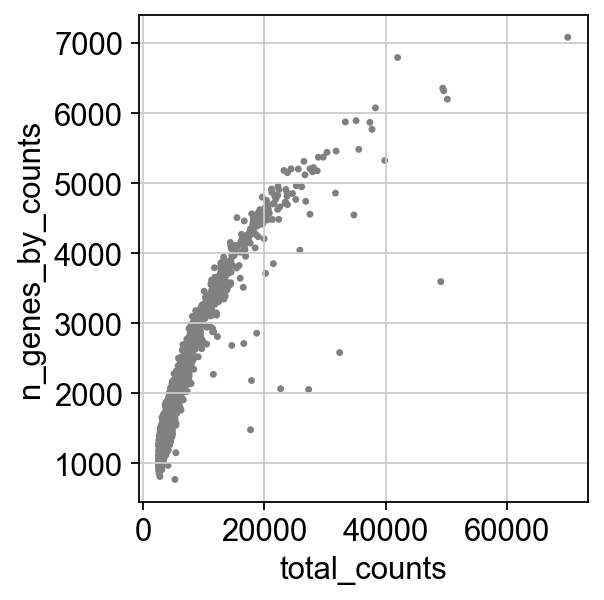

In [43]:
sc.pl.scatter(rLN1_adata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(rLN1_adata, x='total_counts', y='n_genes_by_counts')

Actually do the filtering by slicing the AnnData object.

In [44]:
rLN1_adata = rLN1_adata[rLN1_adata.obs.n_genes_by_counts < 2500, :]
rLN1_adata = rLN1_adata[rLN1_adata.obs.pct_counts_mt < 5, :]

Total-count normalize (library-size correct) the data matrix 
 to 10,000 reads per cell, so that counts become comparable among cells.

In [45]:
sc.pp.normalize_total(rLN1_adata, target_sum=1e4)

normalizing counts per cell
    finished (0:00:00)


C:\Users\annes\anaconda3\envs\single_cell_env\lib\site-packages\scanpy\preprocessing\_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


Logarithmize the data:



In [49]:
sc.pp.log1p(rLN1_adata)

Identify highly-variable genes.

In [50]:
sc.pp.highly_variable_genes(rLN1_adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


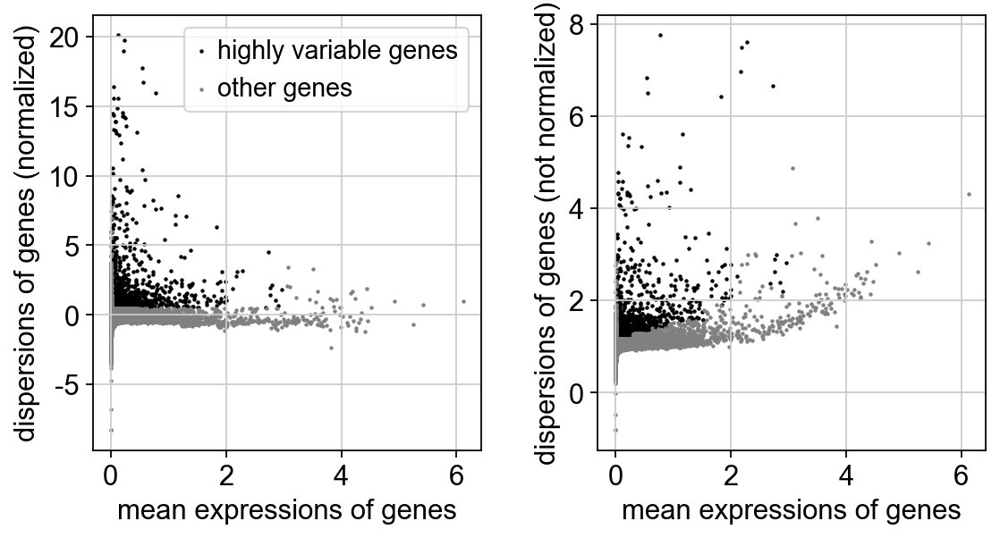

In [51]:
sc.pl.highly_variable_genes(rLN1_adata)

Set the .raw attribute of the AnnData object to the normalized and logarithmized raw gene expression for later use in differential testing and visualizations of gene expression. This simply freezes the state of the AnnData object.

In [52]:
rLN1_adata.raw = rLN1_adata

Actually do the filtering

In [53]:
rLN1_adata = rLN1_adata[:, rLN1_adata.var.highly_variable]

Regress out effects of total counts per cell and the percentage of mitochondrial genes expressed. Scale the data to unit variance.

In [54]:
sc.pp.regress_out(rLN1_adata, ['total_counts', 'pct_counts_mt'])

regressing out ['total_counts', 'pct_counts_mt']
    sparse input is densified and may lead to high memory use
    finished (0:00:05)


Scale each gene to unit variance. Clip values exceeding standard deviation 10.



In [55]:
sc.pp.scale(rLN1_adata, max_value=10)

## Computing the neighborhood graph
Let us compute the neighborhood graph of cells using the PCA representation of the data matrix.

In [199]:
# computing the PCA
sc.pp.pca(rLN1_adata)
# Computing
sc.pp.neighbors(rLN1_adata, n_neighbors=10, n_pcs=40)

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished (0:00:00)


## Embedding the neighborhood graph
We suggest embedding the graph in two dimensions using UMAP (McInnes et al., 2018), see below. It is potentially more faithful to the global connectivity of the manifold than tSNE, i.e., it better preserves trajectories. In some ocassions, you might still observe disconnected clusters and similar connectivity violations. They can usually be remedied by running:

### Clustering the neighborhood graph
As with Seurat and many other frameworks, we recommend the Leiden graph-clustering method (community detection based on optimizing modularity) by Traag et al. (2018). Note that Leiden clustering directly clusters the neighborhood graph of cells, which we already computed in the previous section.

In [66]:
sc.tl.leiden(rLN1_adata)

running Leiden clustering
    finished: found 13 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


Plot the clusters, which agree quite well with the result of Seurat.

C:\Users\annes\anaconda3\envs\single_cell_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


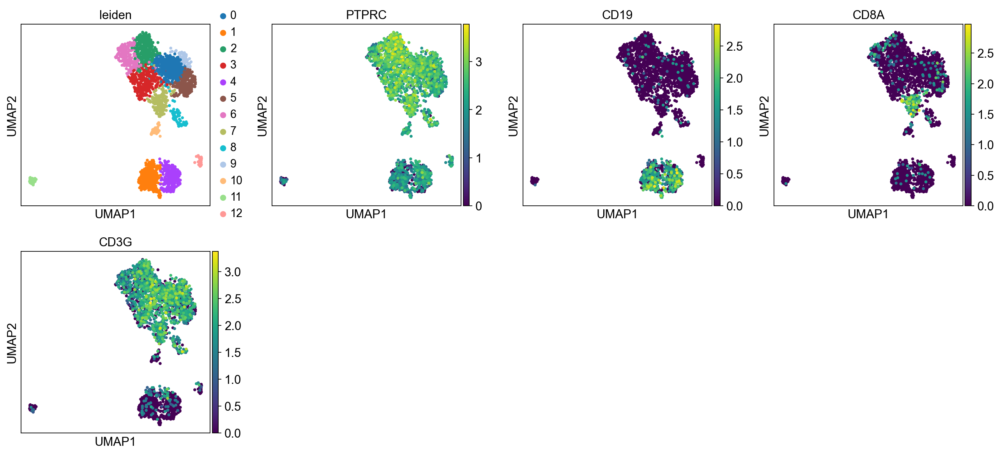

In [67]:
# Setting colours on dofferent known genes to identify the different clusters
sc.pl.umap(rLN1_adata, color=['leiden', 'PTPRC', 'CD19', 'CD8A', 'CD3G'])

Save the result.

In [68]:
rLN1_adata.write(results_file)

### Finding marker genes
Let us compute a ranking for the highly differential genes in each cluster. For this, by default, the .raw attribute of AnnData is used in case it has been initialized before.

We can use logistic regression to identify the marker genes of each cluster. For instance, this has been suggested by Natranos et al. (2018). (I will only do this for the rLN1 sample to identify markers genes to then label the clusters)

ranking genes
    finished (0:00:01)


C:\Users\annes\anaconda3\envs\single_cell_env\lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


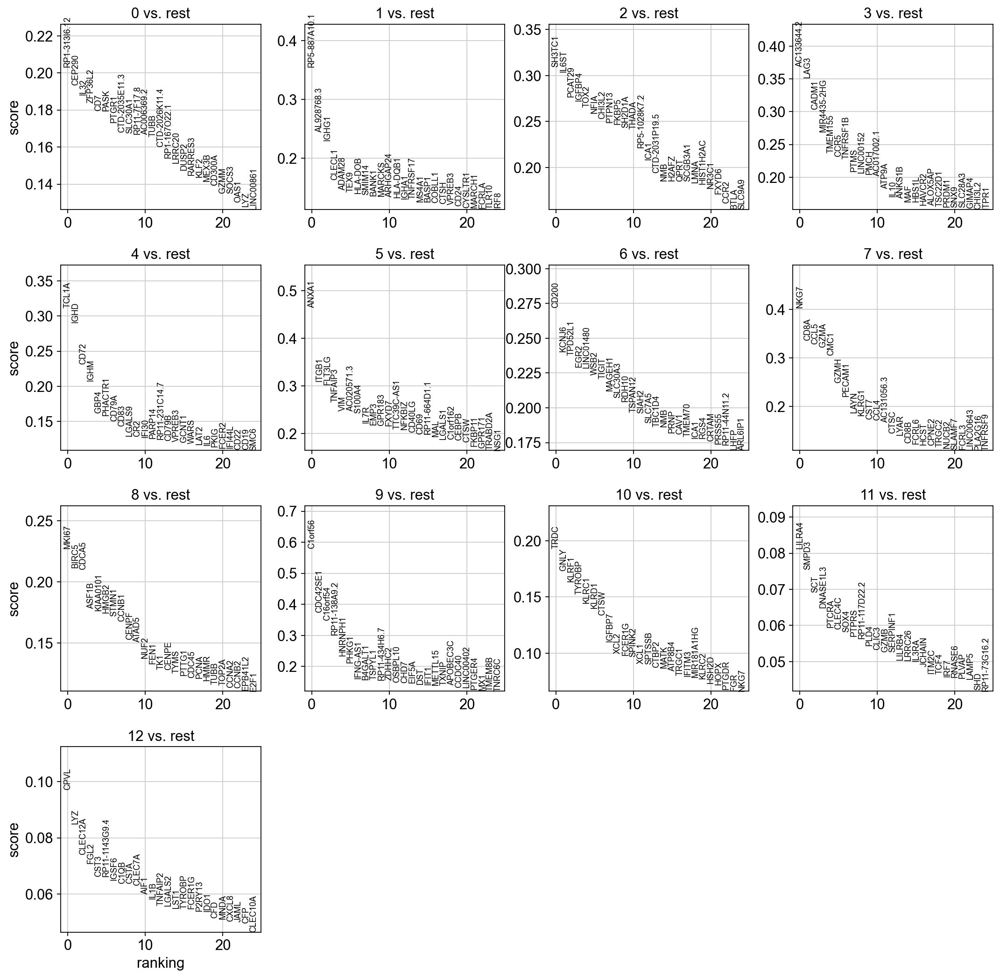

In [73]:
sc.tl.rank_genes_groups(rLN1_adata, 'leiden', method='logreg', use_raw=False)
sc.pl.rank_genes_groups(rLN1_adata, n_genes=25, sharey=False)

Here, we ran a logistic regression among all the classes from the cells in the sample. It's interesting to do the same logistic regression but only among the B-Cells, which are contained in clusters 1 and 4. I suggest doing this depending on how far I get into the project. 

Let us also define a list of marker genes for later reference.

In [74]:
# this list of genes can help us identify the "identity" of each cluster 
marker_genes = ['IL7R', 'CD79A', 'MS4A1', 'CD8A', 'CD8B', 'LYZ', 'CD14',
                'LGALS3', 'S100A8', 'GNLY', 'NKG7', 'KLRB1',
                'FCGR3A', 'MS4A7', 'FCER1A', 'CST3', 'PTPRC', 'CD19', 'CD3G',
                'IGHG1', 'IGHM', 'IGHD', 'CD27', 'LAG3']

Show the 10 top ranked genes per cluster 0, 1, …, 7 in a dataframe.

In [75]:
pd.DataFrame(rLN1_adata.uns['rank_genes_groups']['names']).head(5)

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,RP1-313I6.12,RP5-887A10.1,SH3TC1,AC133644.2,TCL1A,ANXA1,CD200,NKG7,MKI67,C1orf56,TRDC,LILRA4,CPVL
1,CEP290,AL928768.3,IL6ST,LAG3,IGHD,ITGB1,KCNJ6,CD8A,BIRC5,CDC42SE1,GNLY,SMPD3,LYZ
2,IL32,IGHG1,PCAT29,CADM1,CD72,FLT3LG,TPD52L1,CCL5,CDCA5,C16orf54,KLRF1,SCT,CLEC12A
3,ZFP36L2,CLECL1,IGFBP4,MIR4435-2HG,IGHM,TNFAIP3,EGR2,GZMA,ASF1B,RP11-138A9.2,TYROBP,DNASE1L3,FGL2
4,CD7,ADAM28,TOX2,TMEM155,GBP4,VIM,LINC01480,CMC1,KIAA0101,HNRNPH1,KLRC1,PTCRA,CST3


Get a table with the scores and groups.



In [76]:
result = rLN1_adata.uns['rank_genes_groups']
result

{'params': {'groupby': 'leiden',
  'reference': 'rest',
  'method': 'logreg',
  'use_raw': False,
  'layer': None,
  'corr_method': 'benjamini-hochberg'},
 'names': rec.array([('RP1-313I6.12', 'RP5-887A10.1', 'SH3TC1', 'AC133644.2', 'TCL1A', 'ANXA1', 'CD200', 'NKG7', 'MKI67', 'C1orf56', 'TRDC', 'LILRA4', 'CPVL'),
            ('CEP290', 'AL928768.3', 'IL6ST', 'LAG3', 'IGHD', 'ITGB1', 'KCNJ6', 'CD8A', 'BIRC5', 'CDC42SE1', 'GNLY', 'SMPD3', 'LYZ'),
            ('IL32', 'IGHG1', 'PCAT29', 'CADM1', 'CD72', 'FLT3LG', 'TPD52L1', 'CCL5', 'CDCA5', 'C16orf54', 'KLRF1', 'SCT', 'CLEC12A'),
            ...,
            ('LAG3', 'HCST', 'TNFRSF9', 'TSPAN12', 'MNDA', 'PASK', 'NOL3', 'ADTRP', 'APOBEC3A', 'IFNG', 'CD3G', 'CD7', 'CD2'),
            ('ANXA1', 'IGHD', 'FEN1', 'IL7R', 'AL928768.3', 'TGIF1', 'SOCS3', 'TUBA1B', 'LTB', 'TIGIT', 'KLRG1', 'IL32', 'RP5-1028K7.2'),
            ('C1orf56', 'TCL1A', 'KCNJ6', 'GZMM', 'RP5-887A10.1', 'ACTG1', 'ACTG1', 'LTB', 'FTL', 'PKM', 'RGCC', 'CD69', 'IL32')],
   

In our case as I am pursuing the analysis with the logistic regression I have to compute the p_values for each gene. But more interrestingly it would be better to extract the B-cells and run some clustering on the B-cells only and then run a logistic regression to identify clusters within the B-cells. 

ranking genes
    finished (0:00:00)


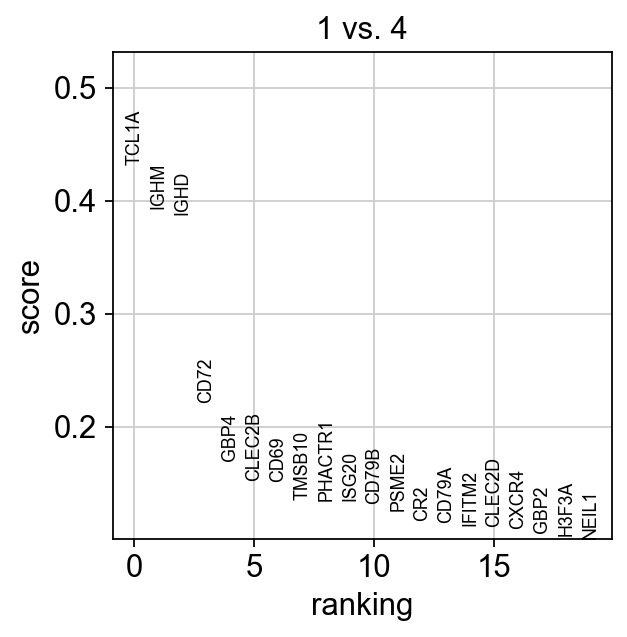

In [77]:
sc.tl.rank_genes_groups(rLN1_adata, 'leiden', groups=['1'], reference='4', method='logreg')
sc.pl.rank_genes_groups(rLN1_adata, groups=['1'], n_genes=20)

C:\Users\annes\anaconda3\envs\single_cell_env\lib\site-packages\seaborn\categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:black'` for same effect.
  warnings.warn(msg, FutureWarning)


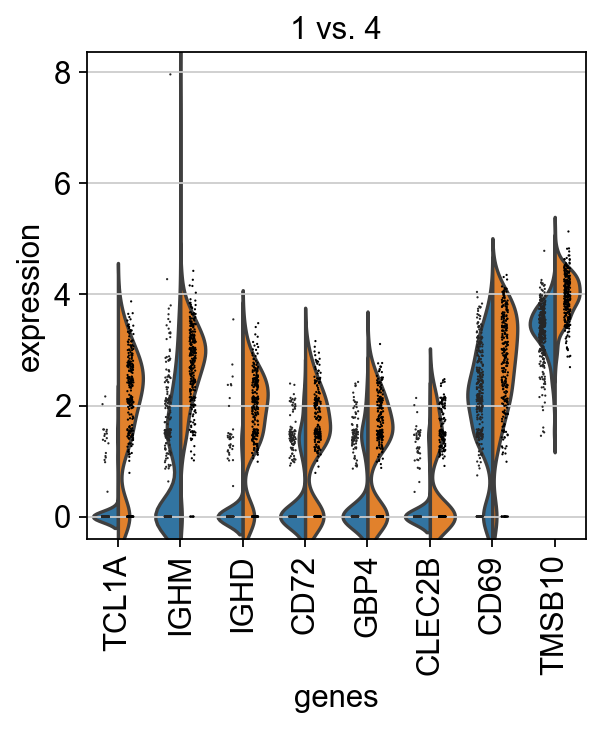

In [78]:
sc.pl.rank_genes_groups_violin(rLN1_adata, groups=['1'], n_genes=8)

Reload, or in our case recalculate the gene differential expression across all the different groups.

In [79]:
sc.tl.rank_genes_groups(rLN1_adata, 'leiden', method='logreg', use_raw=False)

ranking genes
    finished (0:00:01)


C:\Users\annes\anaconda3\envs\single_cell_env\lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [80]:
new_cluster_names = [
    'CD4_T_1', 'B_memory',
    'CD8_T_1', 'Unknown_1',
    'B_naive', 'CD8_T_2',
    'CD4_T_2', 'CD8_T_3', 'Unknown_2', 'CD4_T_3', 'NK_cells', 'Unknown_3', 'CD14_+_Monocytes']
rLN1_adata.rename_categories('leiden', new_cluster_names)

With my current knowledge, I cannot annotate all the different clusters with known cell types. I will try to implement a new library from Python called CellO, which is a machine learning for cell annotation and follows the protocol (https://star-protocols.cell.com/protocols/945). I had some issues setting up the environment and importing the library. It is now working, but I have not had the time to implement it.

C:\Users\annes\anaconda3\envs\single_cell_env\lib\site-packages\scanpy\plotting\_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


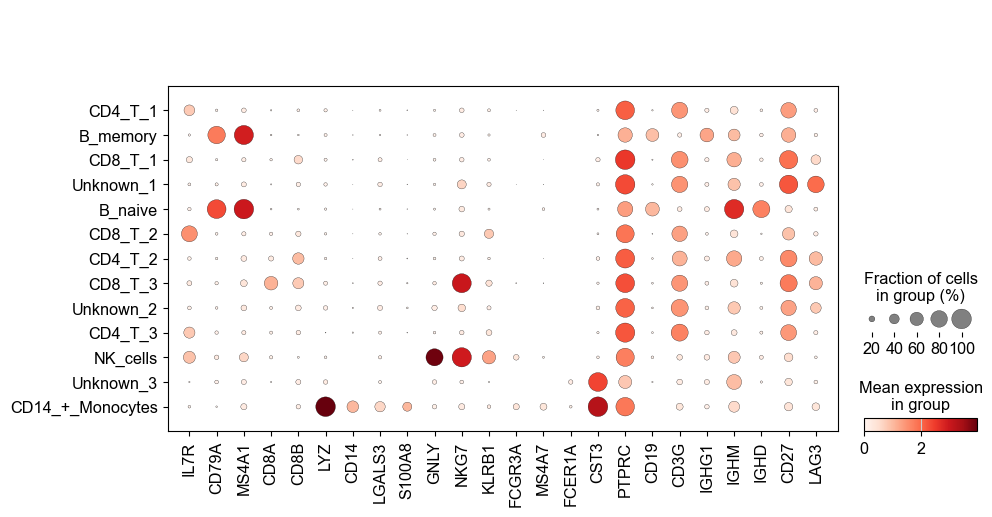

In [193]:
# Looking at the gene expresion of gene of interest among the different clusters
sc.pl.dotplot(rLN1_adata, marker_genes, groupby='leiden')# .savefig('Leiden_groups_markers')

Doing the cell cluster identification can be tricky and requires the knowledge of the expressed protein on the cell surface to identify the cluster identity. CellO does the identification by comparing the gene expression to the already known database, which makes the identification much more accessible and probably more accurate. 

In [85]:
rLN1_adata.write(results_file, compression='gzip')  # `compression='gzip'` saves disk space, but slows down writing and subsequent reading

### Integrating the clustering with the whole dataset

Processing all the Anndata objects.

DLBCL1
normalizing counts per cell
    finished (0:00:00)


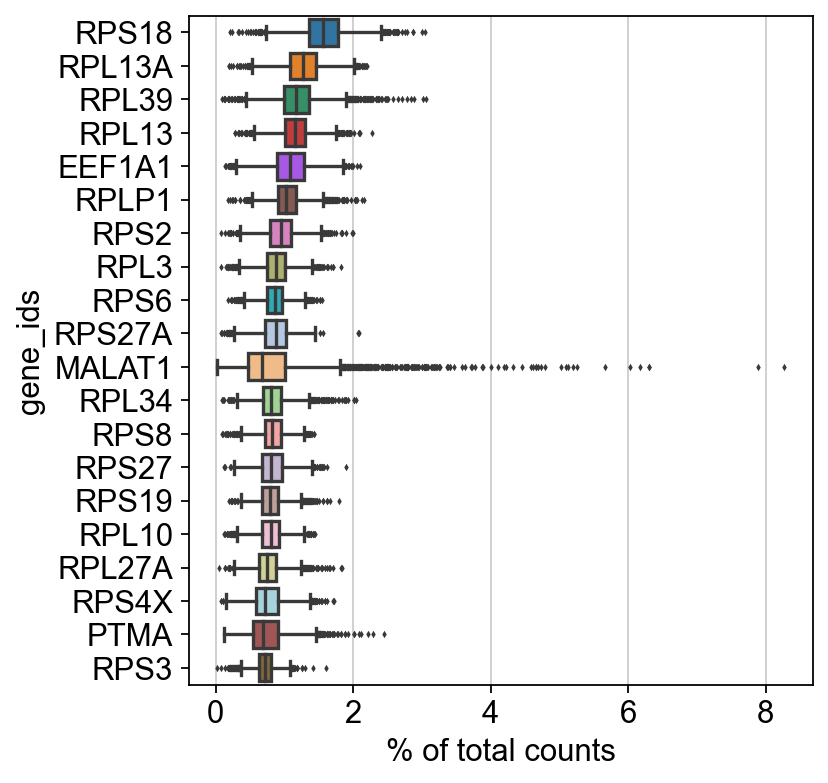

filtered out 15689 genes that are detected in less than 3 cells


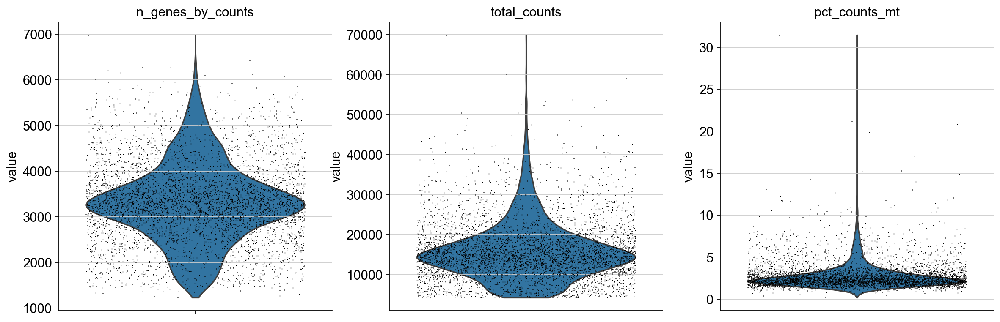

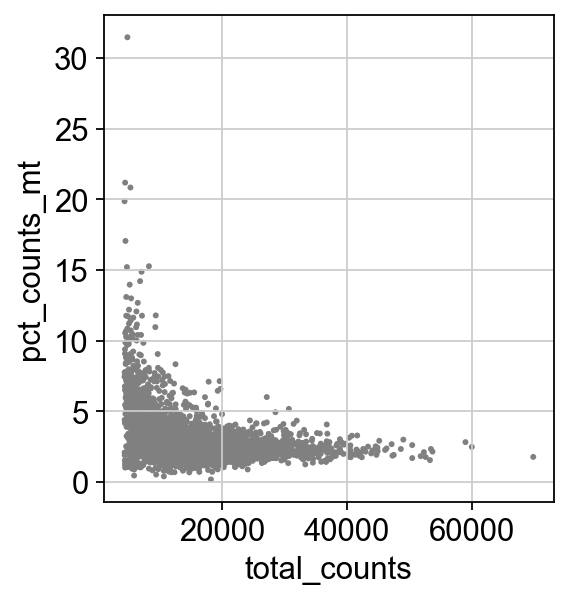

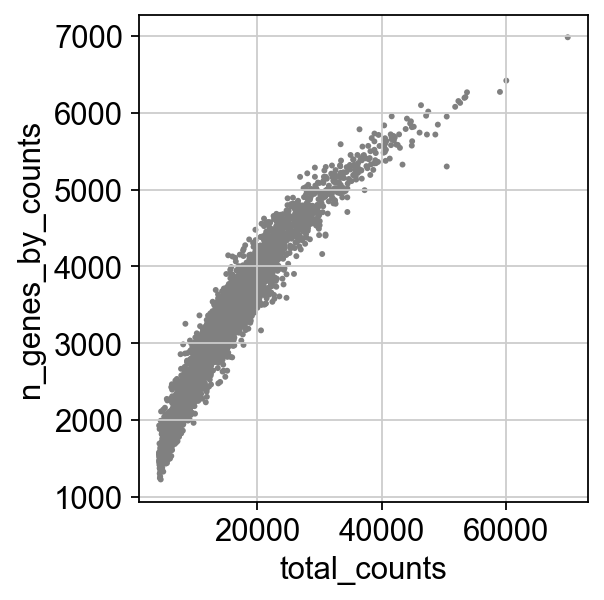

normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes


C:\Users\annes\anaconda3\envs\single_cell_env\lib\site-packages\scanpy\preprocessing\_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:00)


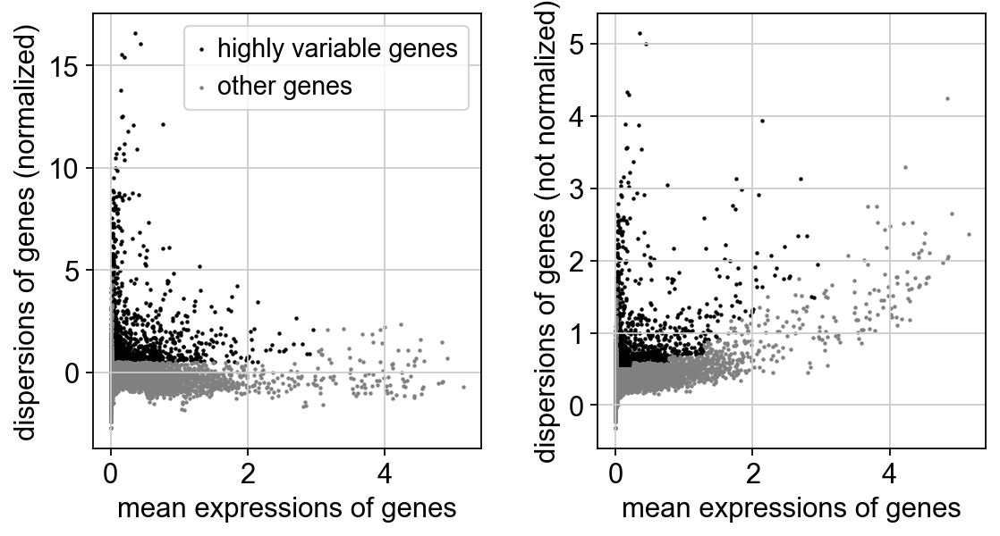

regressing out ['total_counts', 'pct_counts_mt']
    sparse input is densified and may lead to high memory use
    finished (0:00:03)
DLBCL2
normalizing counts per cell
    finished (0:00:00)


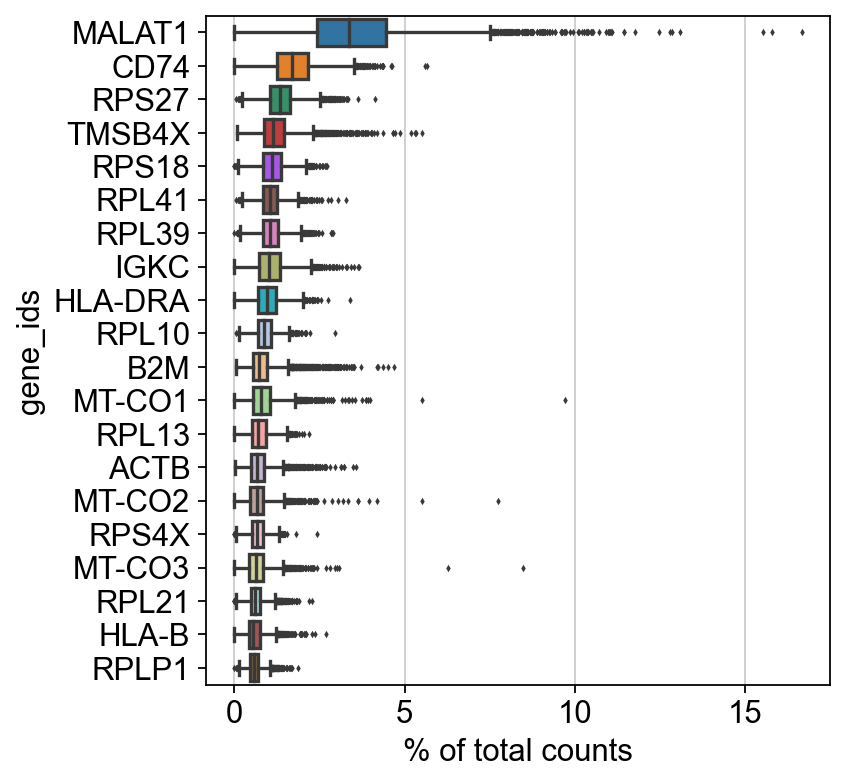

filtered out 16282 genes that are detected in less than 3 cells


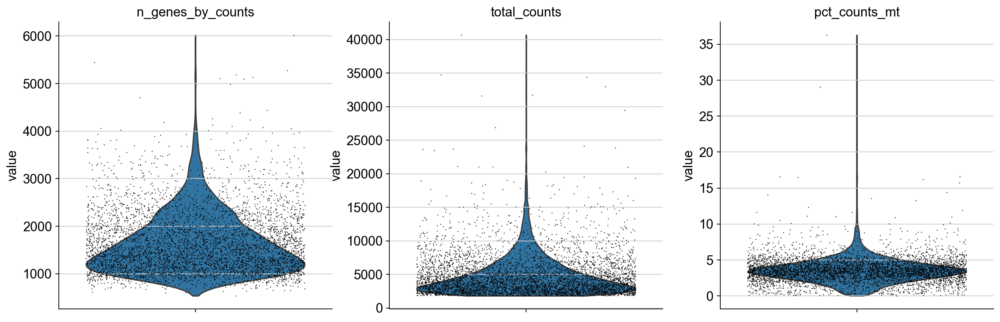

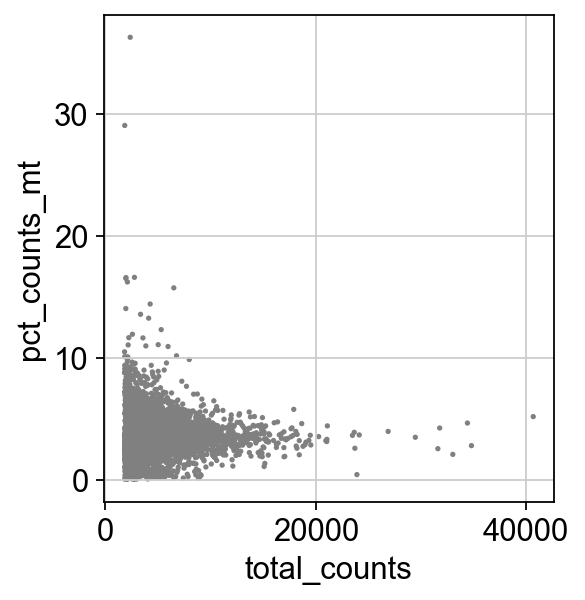

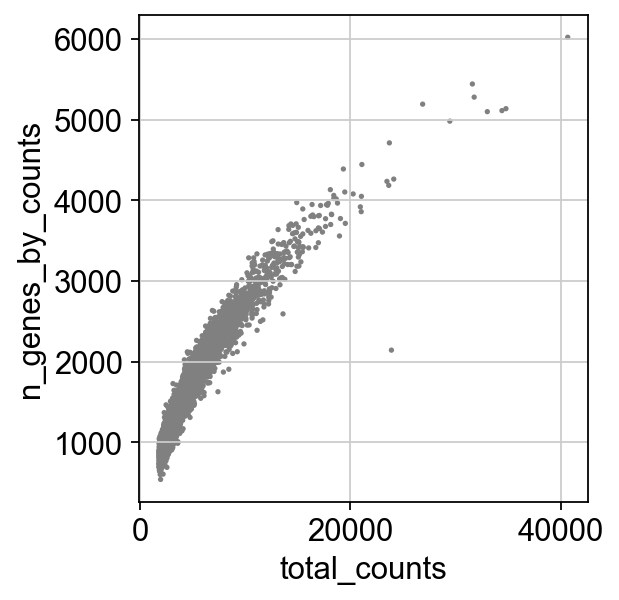

normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes


C:\Users\annes\anaconda3\envs\single_cell_env\lib\site-packages\scanpy\preprocessing\_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:00)


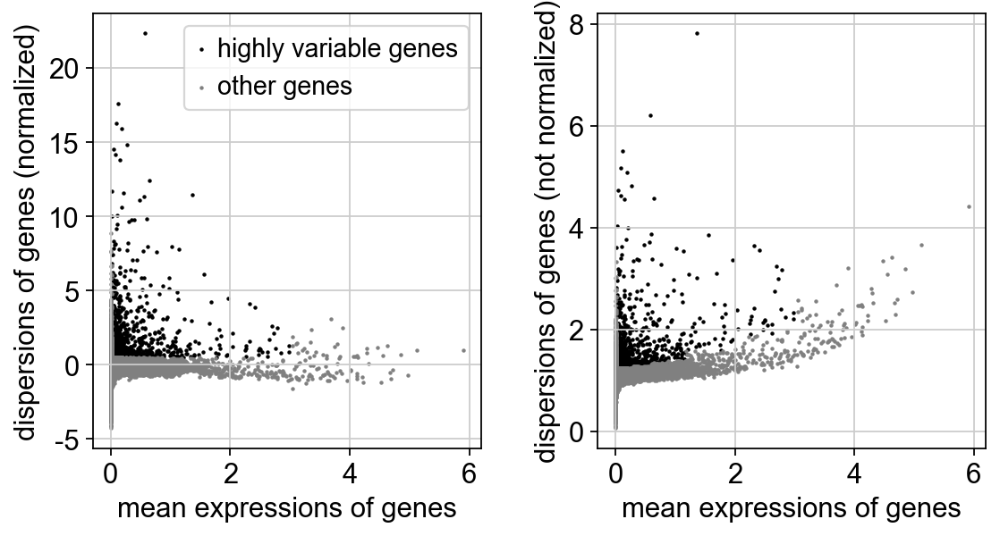

regressing out ['total_counts', 'pct_counts_mt']
    sparse input is densified and may lead to high memory use
    finished (0:00:09)
DLBCL3
normalizing counts per cell
    finished (0:00:00)


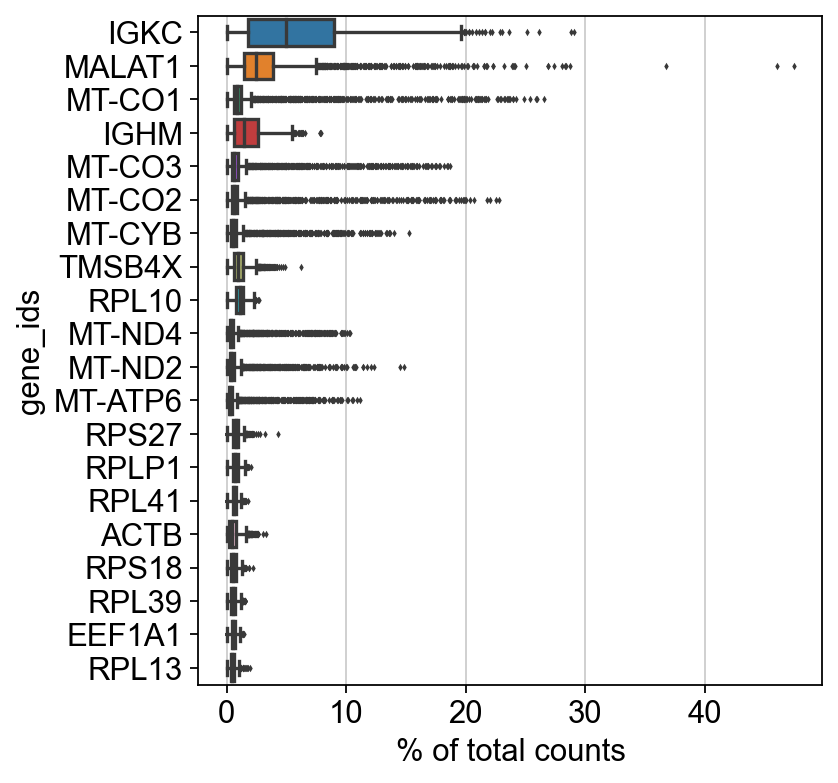

filtered out 94 cells that have less than 200 genes expressed
filtered out 16272 genes that are detected in less than 3 cells


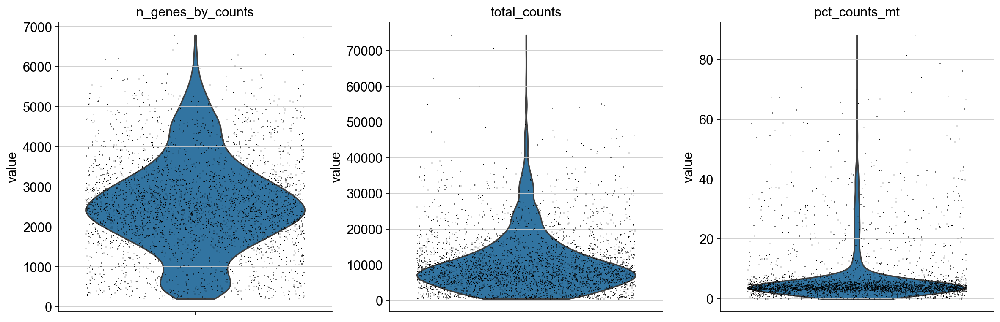

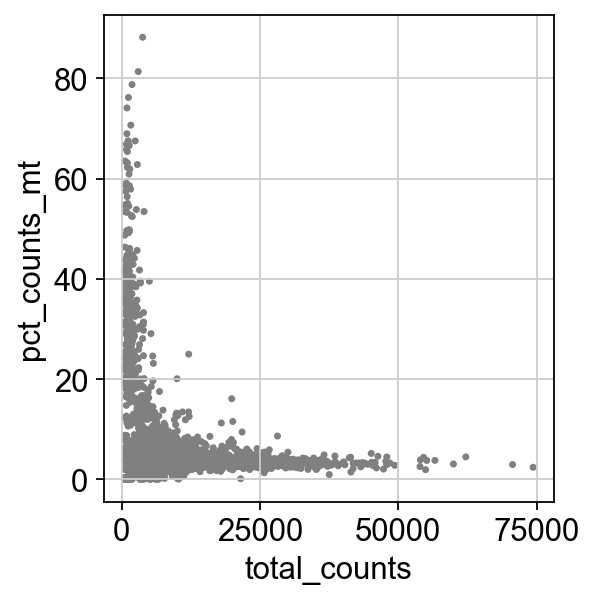

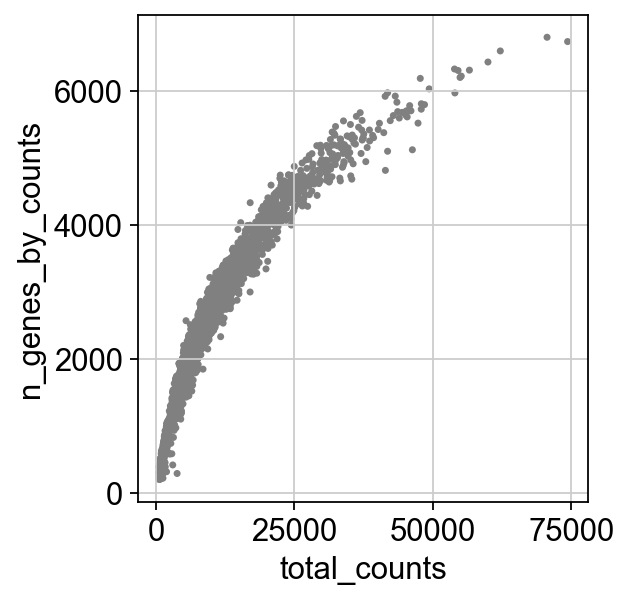

normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes


C:\Users\annes\anaconda3\envs\single_cell_env\lib\site-packages\scanpy\preprocessing\_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:00)


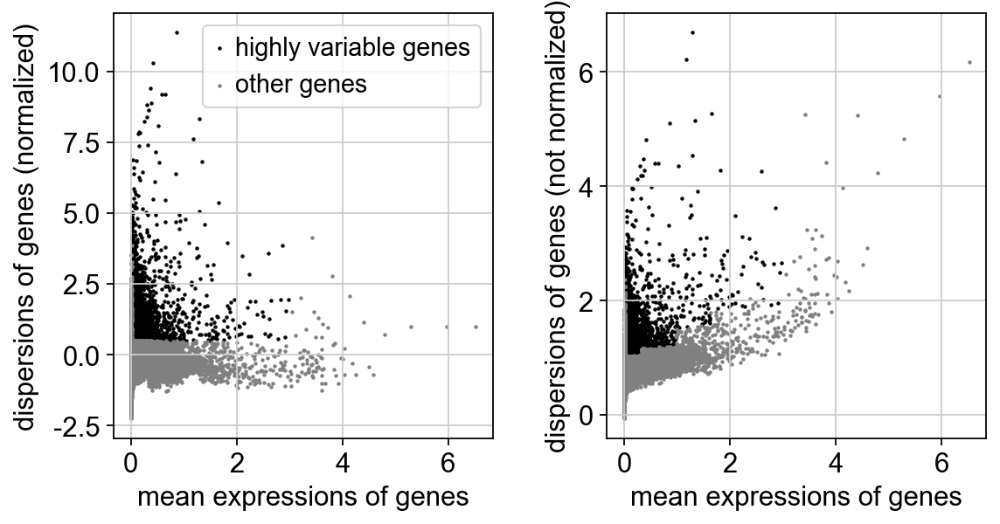

regressing out ['total_counts', 'pct_counts_mt']
    sparse input is densified and may lead to high memory use
    finished (0:00:06)
FL1
normalizing counts per cell
    finished (0:00:00)


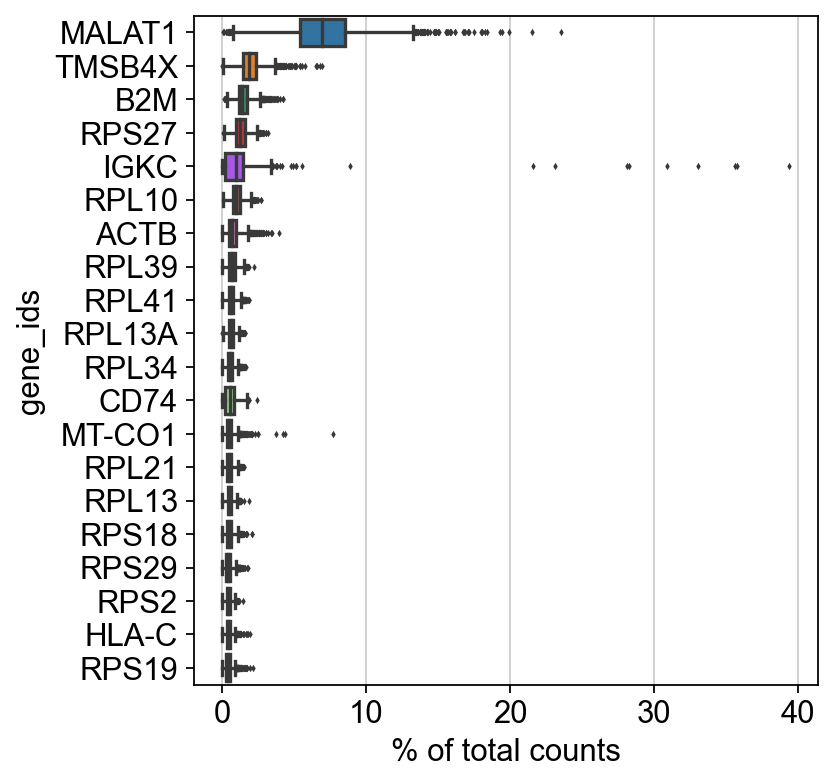

filtered out 16296 genes that are detected in less than 3 cells


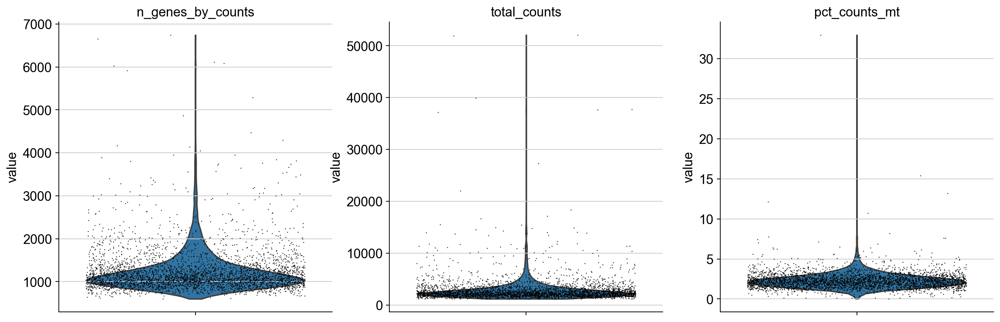

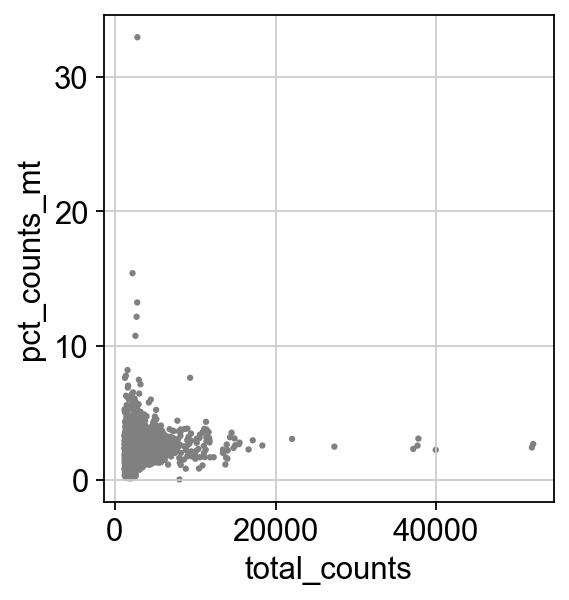

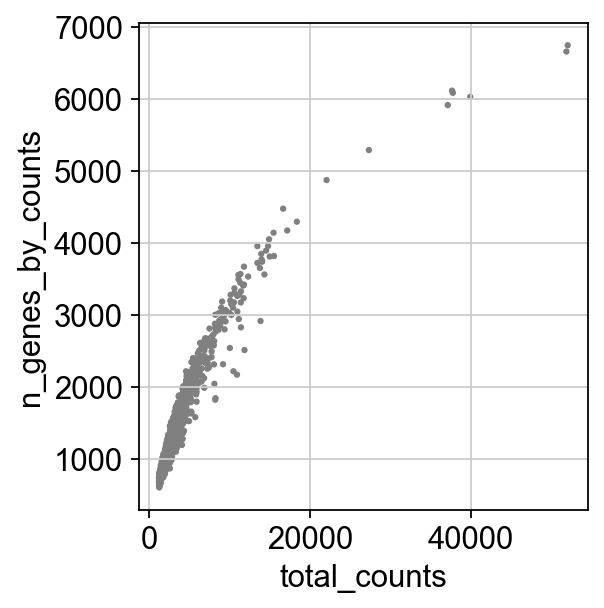

normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes


C:\Users\annes\anaconda3\envs\single_cell_env\lib\site-packages\scanpy\preprocessing\_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:00)


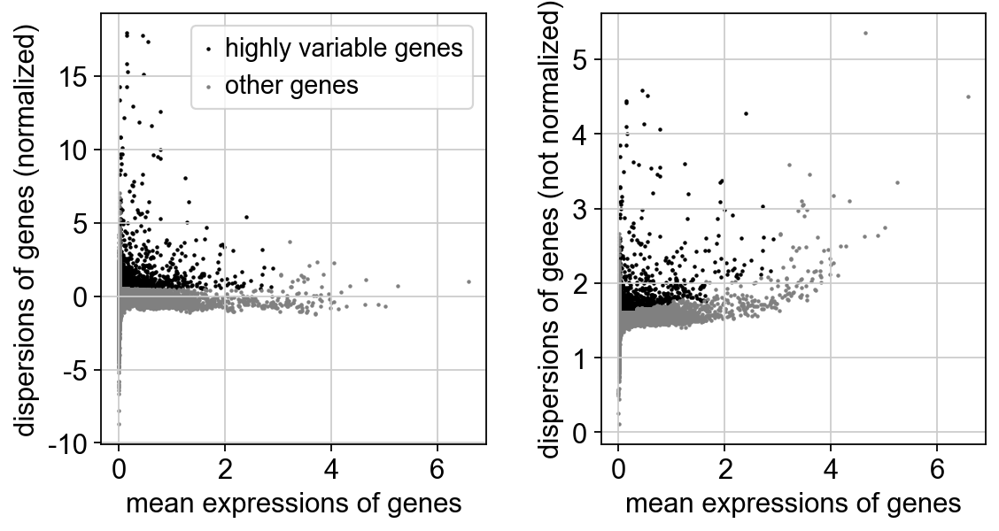

regressing out ['total_counts', 'pct_counts_mt']
    sparse input is densified and may lead to high memory use
    finished (0:00:12)
FL2
normalizing counts per cell
    finished (0:00:00)


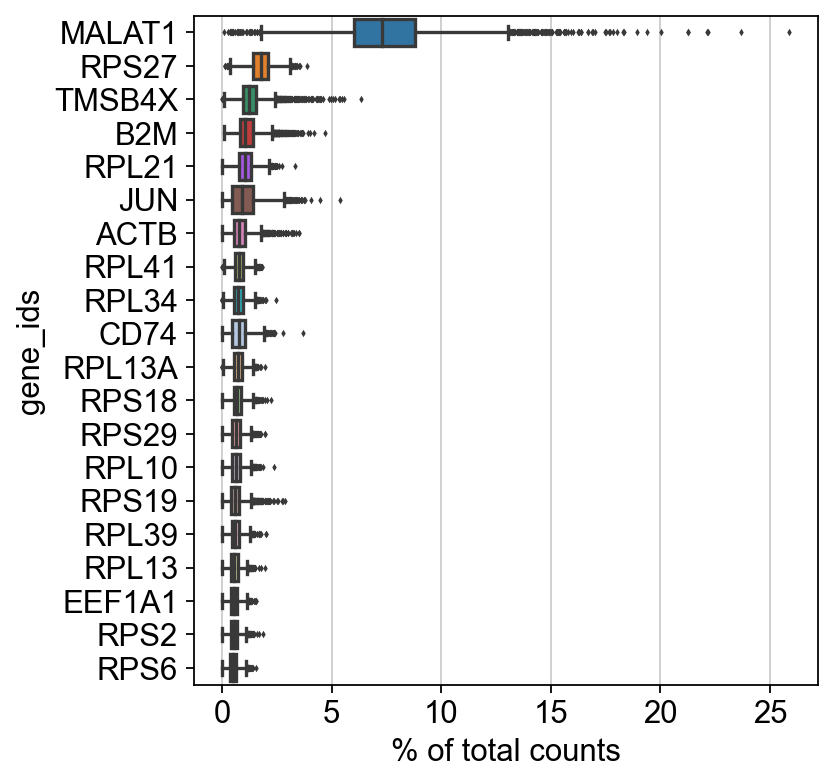

filtered out 3 cells that have less than 200 genes expressed
filtered out 16380 genes that are detected in less than 3 cells


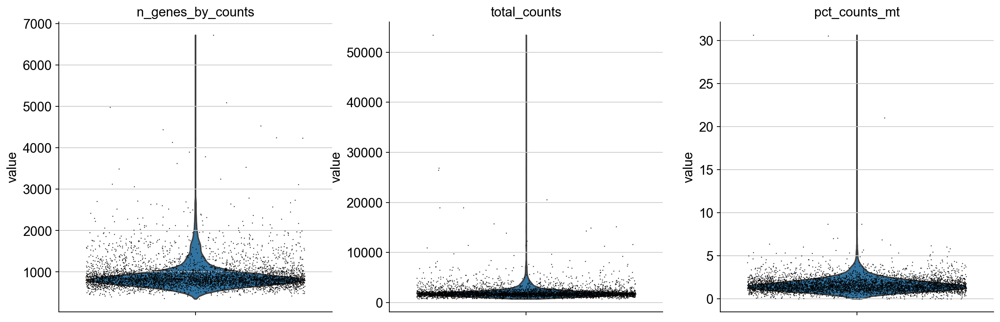

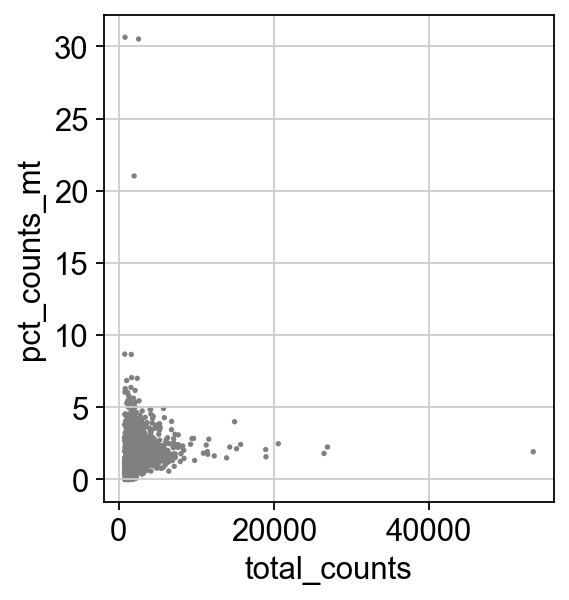

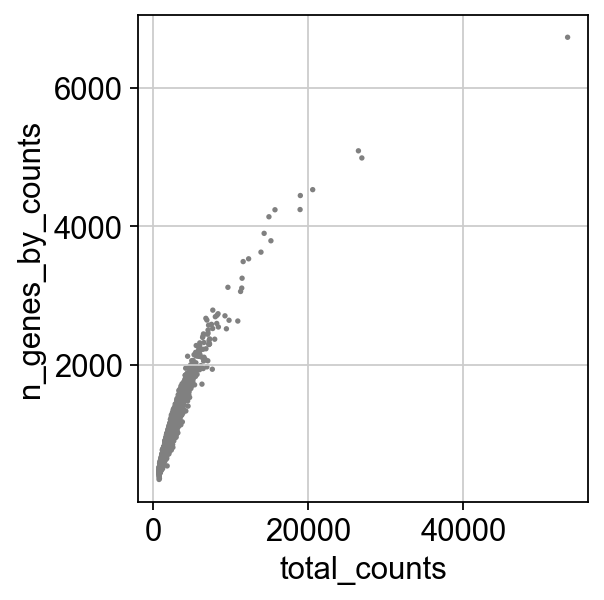

normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes


C:\Users\annes\anaconda3\envs\single_cell_env\lib\site-packages\scanpy\preprocessing\_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:00)


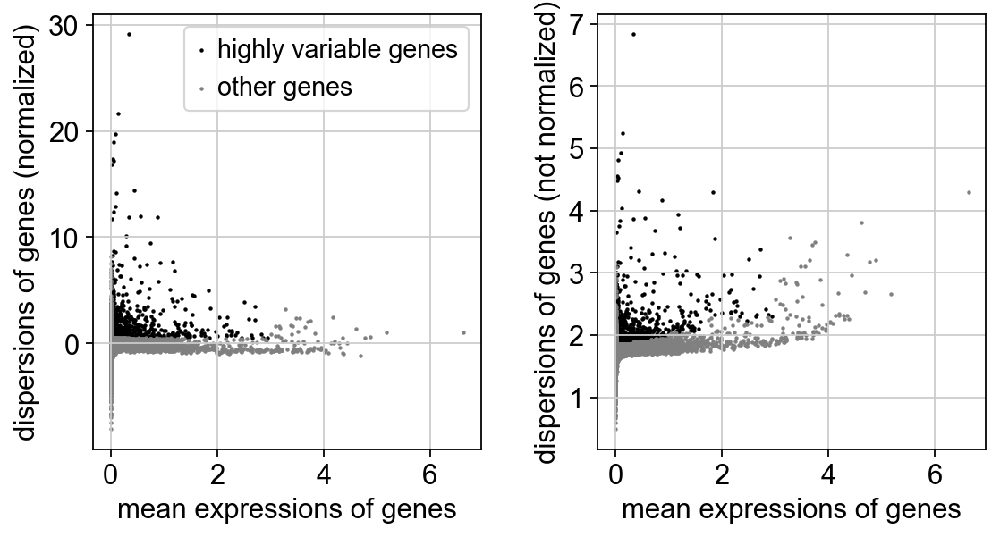

regressing out ['total_counts', 'pct_counts_mt']
    sparse input is densified and may lead to high memory use
    finished (0:00:12)
FL3
normalizing counts per cell
    finished (0:00:00)


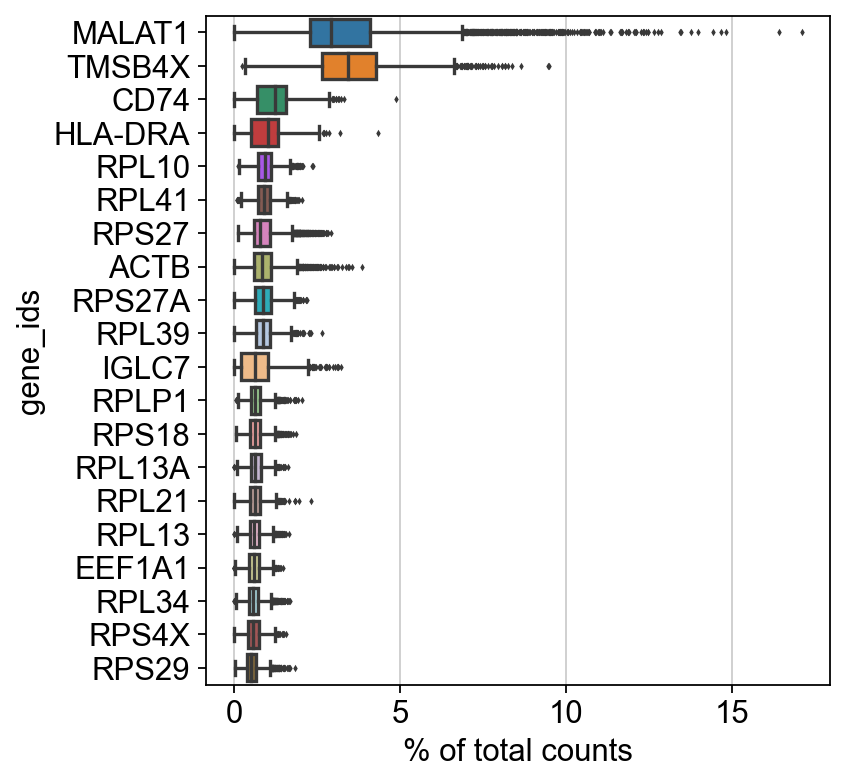

filtered out 15483 genes that are detected in less than 3 cells


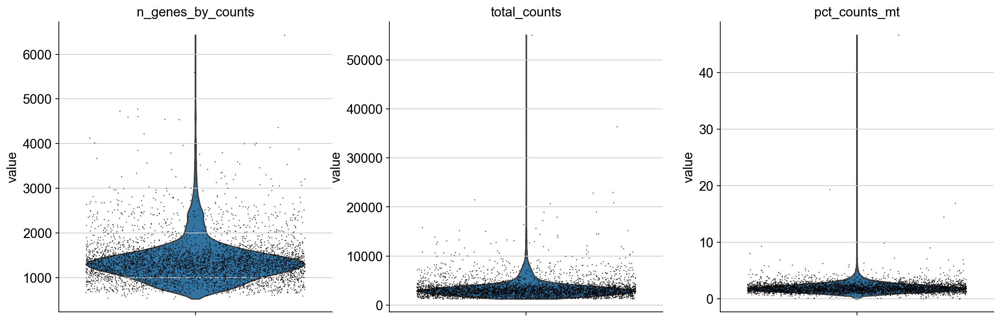

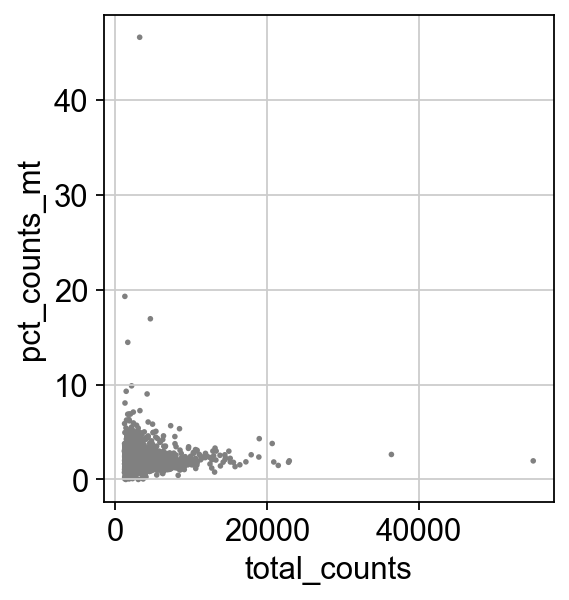

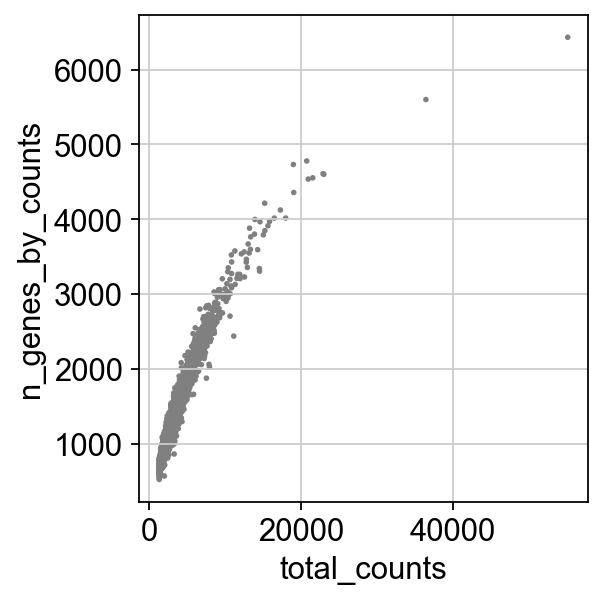

normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes


C:\Users\annes\anaconda3\envs\single_cell_env\lib\site-packages\scanpy\preprocessing\_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:00)


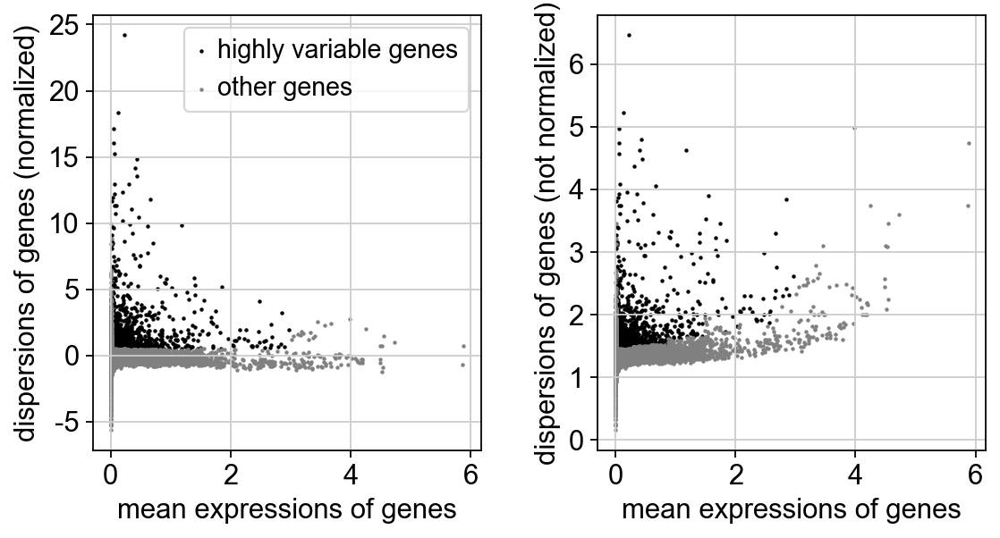

regressing out ['total_counts', 'pct_counts_mt']
    sparse input is densified and may lead to high memory use
    finished (0:00:10)
FL4
normalizing counts per cell
    finished (0:00:00)


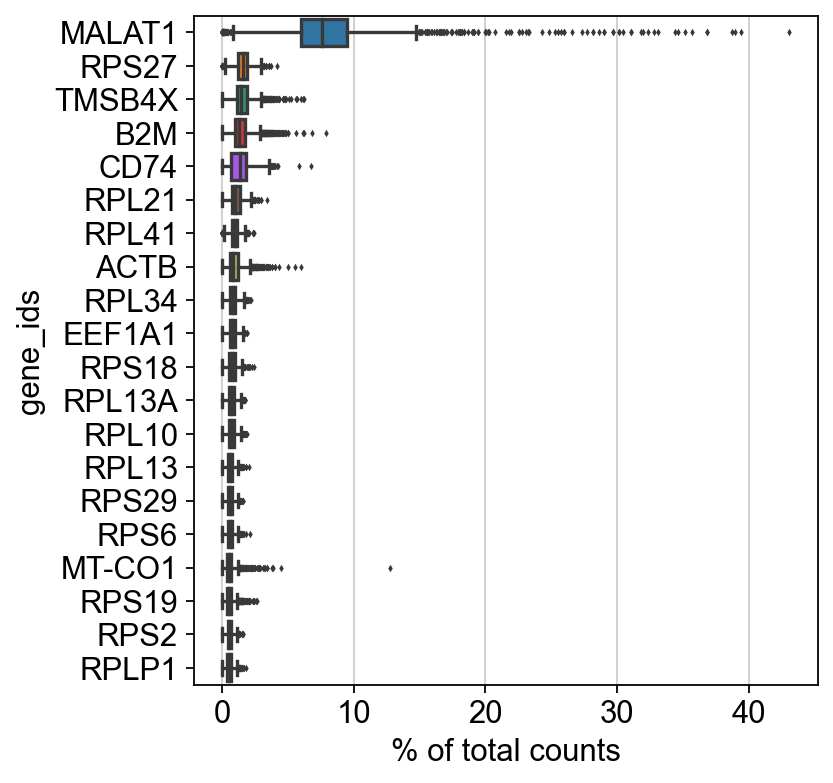

filtered out 1 cells that have less than 200 genes expressed
filtered out 17183 genes that are detected in less than 3 cells


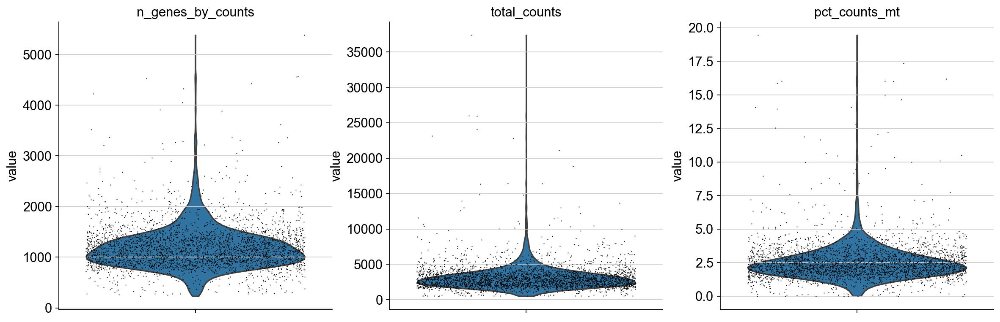

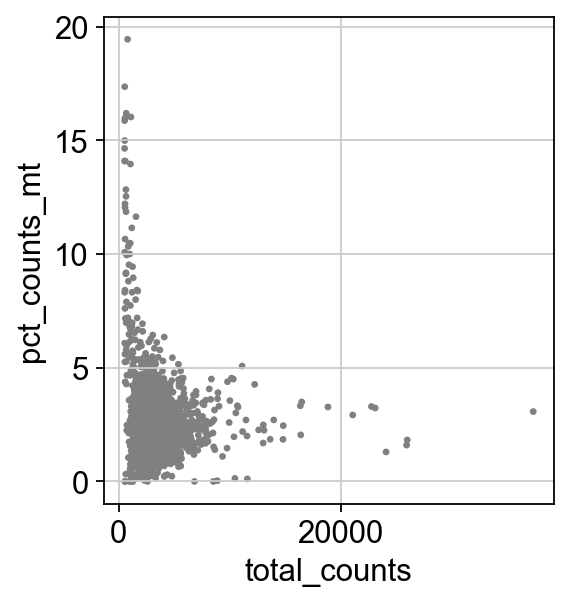

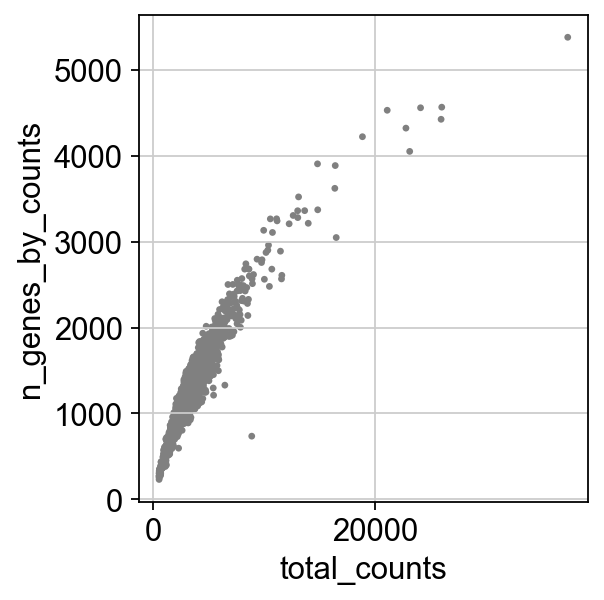

normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes


C:\Users\annes\anaconda3\envs\single_cell_env\lib\site-packages\scanpy\preprocessing\_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:00)


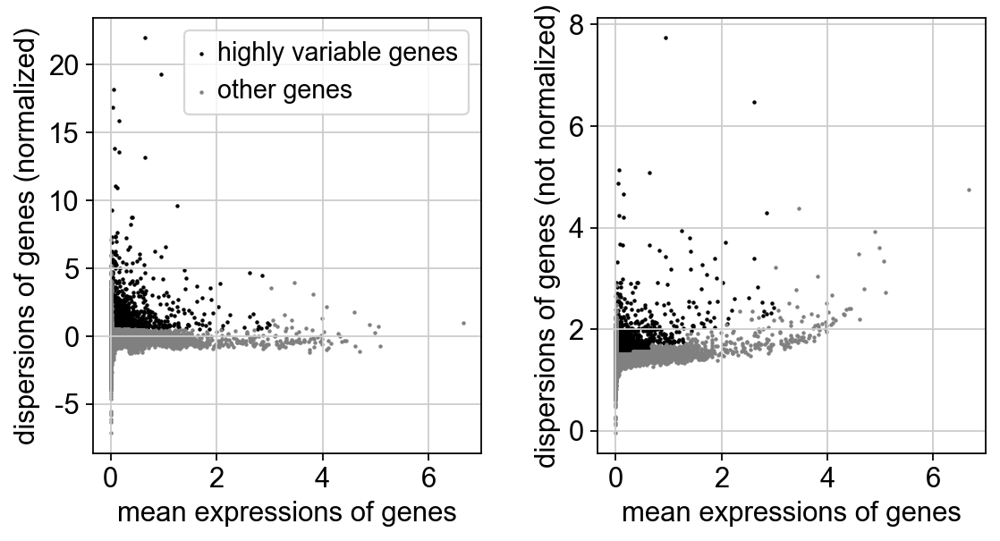

regressing out ['total_counts', 'pct_counts_mt']
    sparse input is densified and may lead to high memory use
    finished (0:00:10)
rLN1
normalizing counts per cell
    finished (0:00:00)


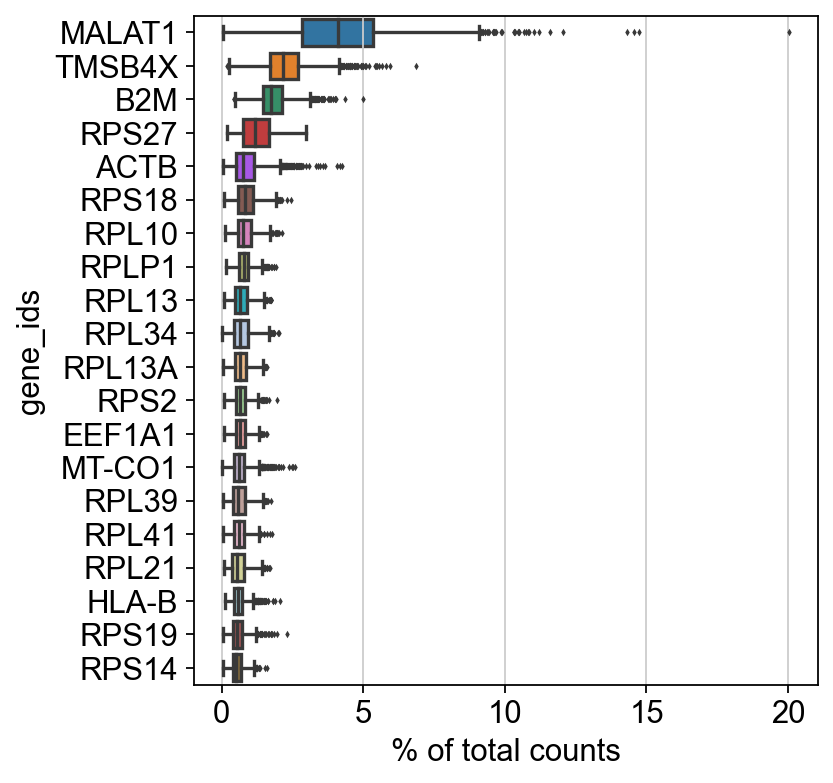

filtered out 15875 genes that are detected in less than 3 cells


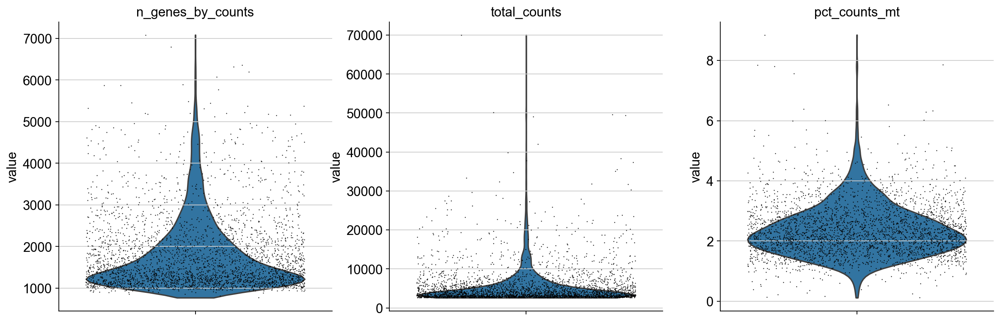

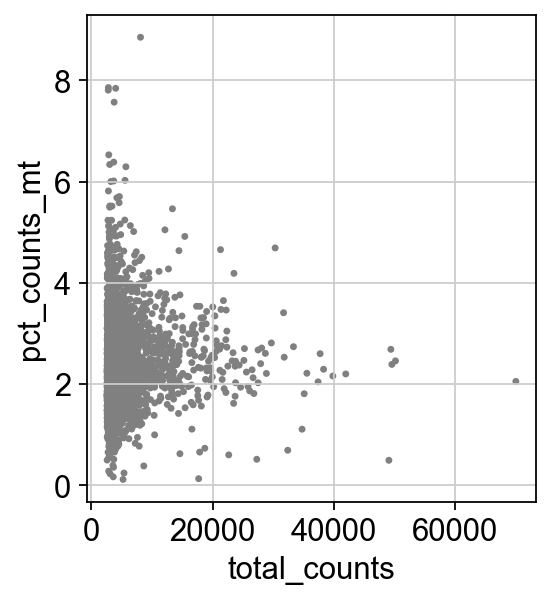

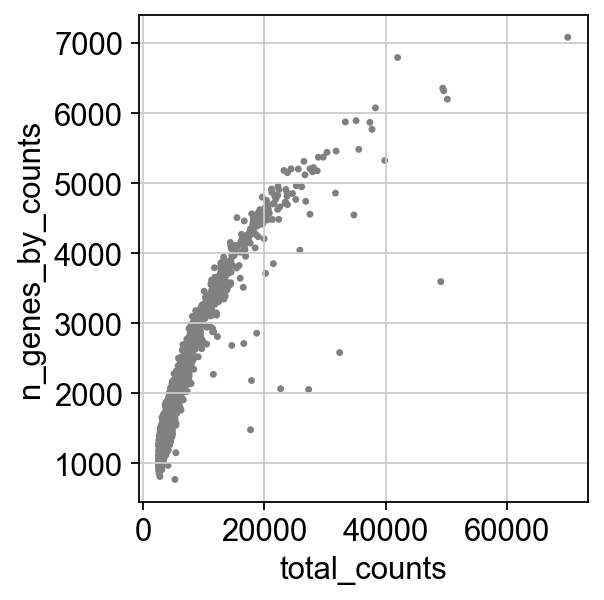

normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes


C:\Users\annes\anaconda3\envs\single_cell_env\lib\site-packages\scanpy\preprocessing\_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:00)


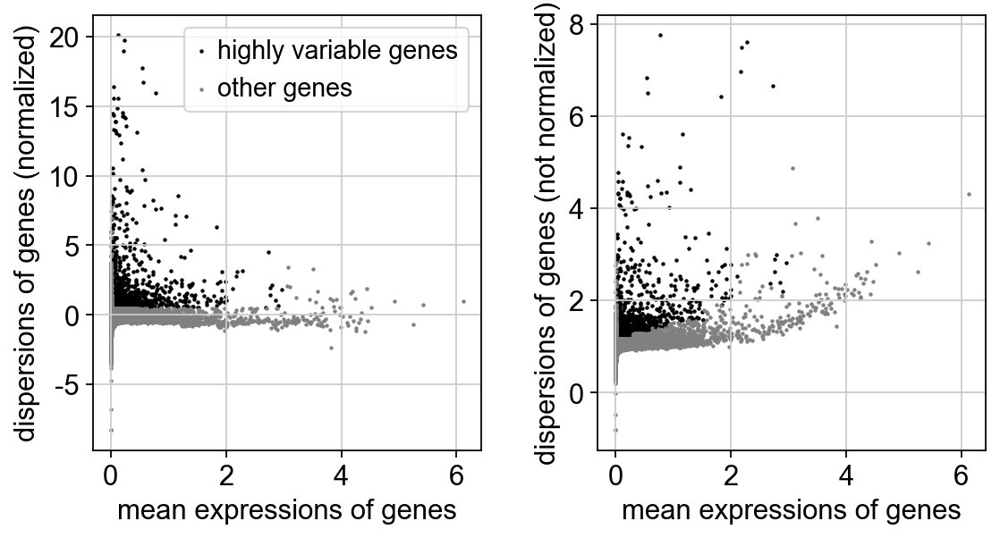

regressing out ['total_counts', 'pct_counts_mt']
    sparse input is densified and may lead to high memory use
    finished (0:00:04)
rLN2
normalizing counts per cell
    finished (0:00:00)


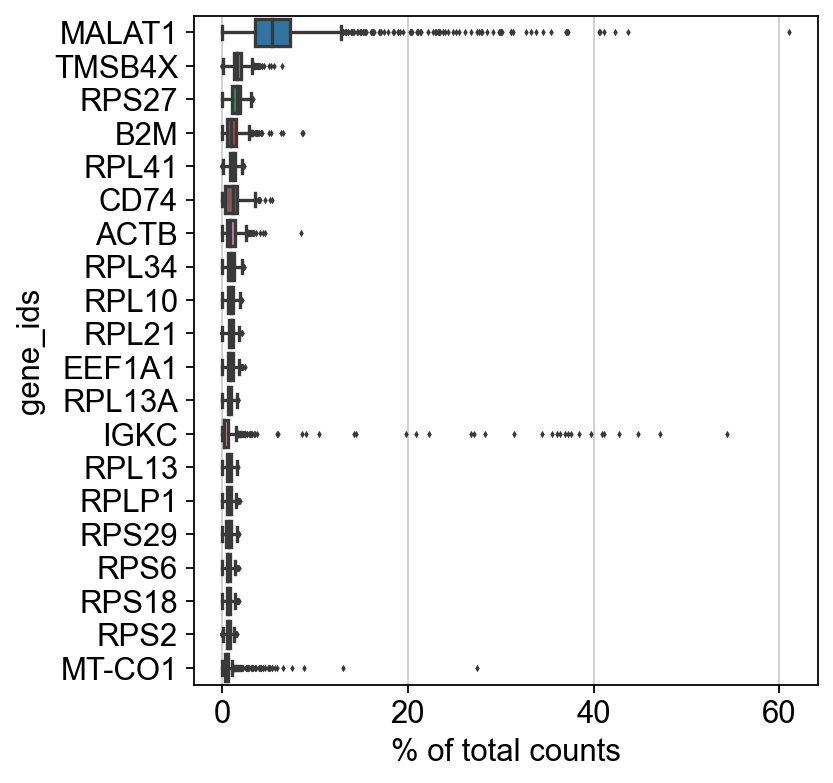

filtered out 2 cells that have less than 200 genes expressed
filtered out 16855 genes that are detected in less than 3 cells


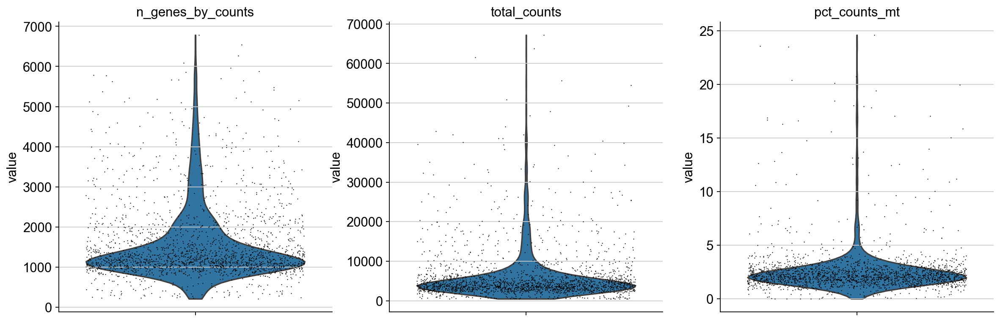

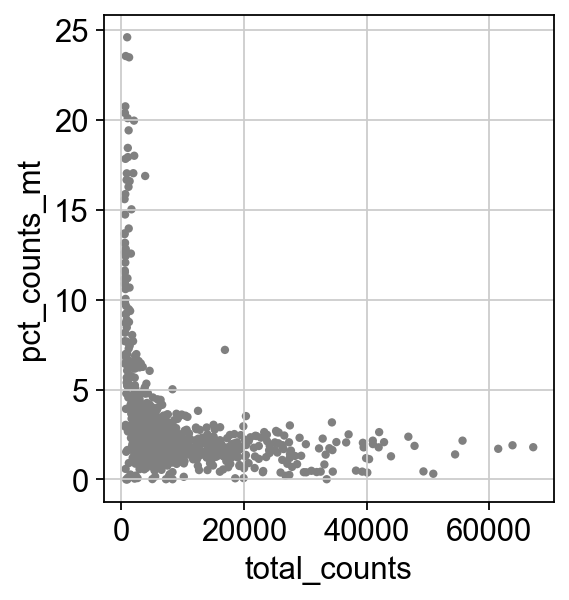

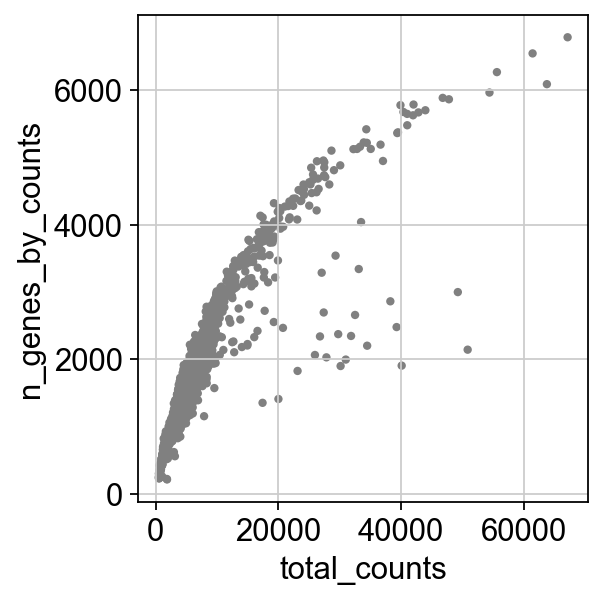

normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes


C:\Users\annes\anaconda3\envs\single_cell_env\lib\site-packages\scanpy\preprocessing\_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:00)


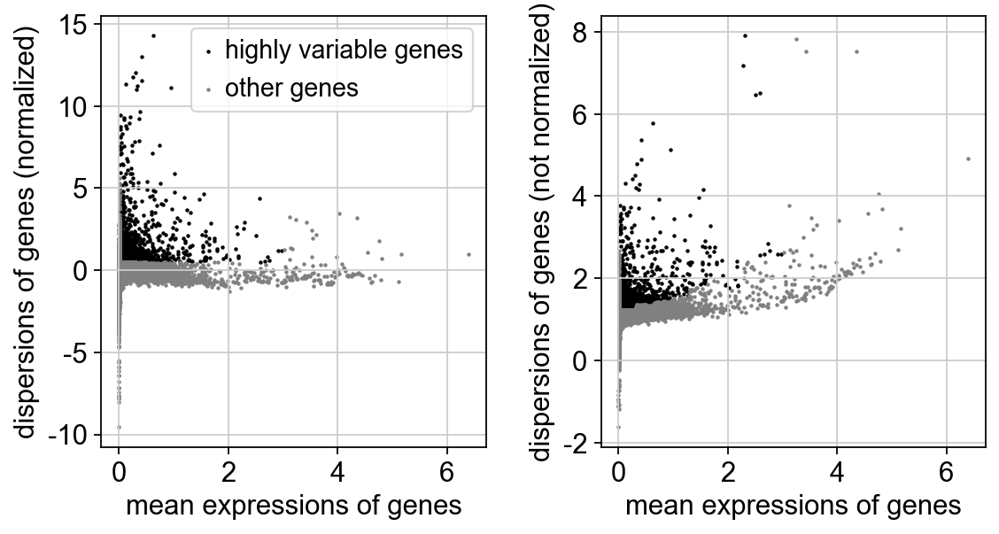

regressing out ['total_counts', 'pct_counts_mt']
    sparse input is densified and may lead to high memory use
    finished (0:00:06)
rLN3
normalizing counts per cell
    finished (0:00:00)


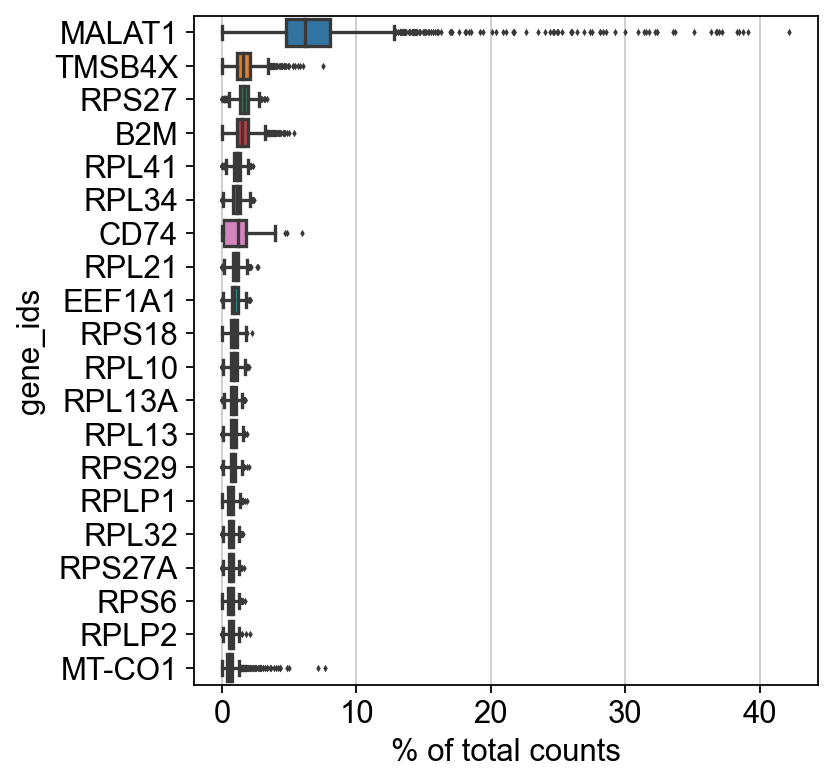

filtered out 16840 genes that are detected in less than 3 cells


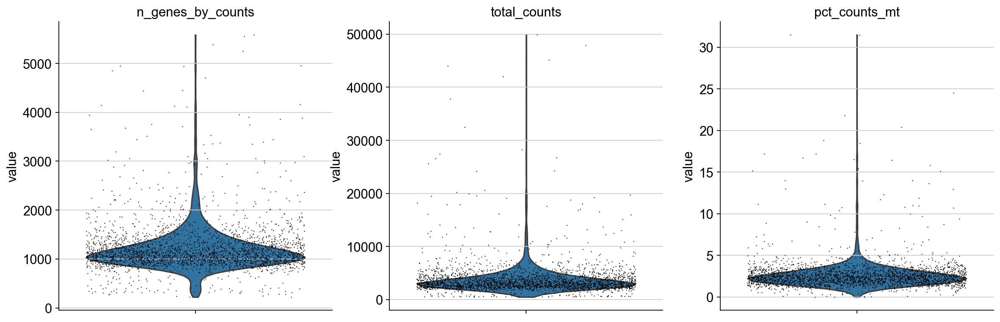

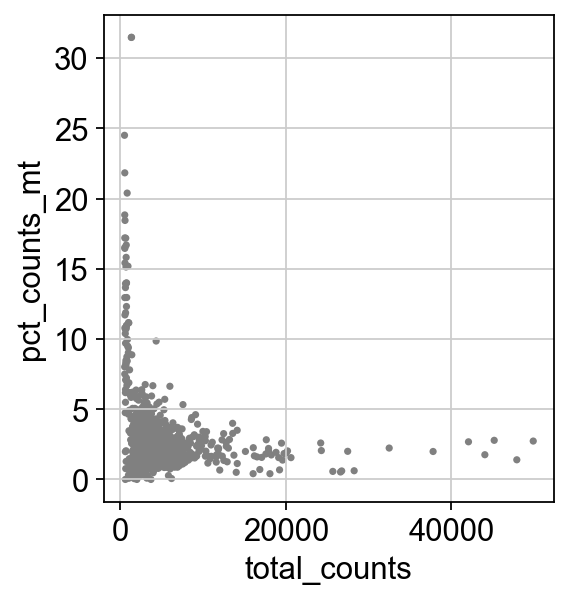

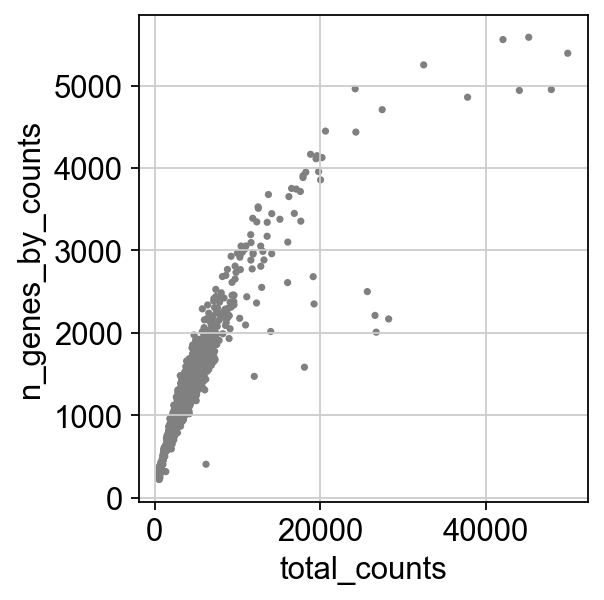

normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes


C:\Users\annes\anaconda3\envs\single_cell_env\lib\site-packages\scanpy\preprocessing\_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:00)


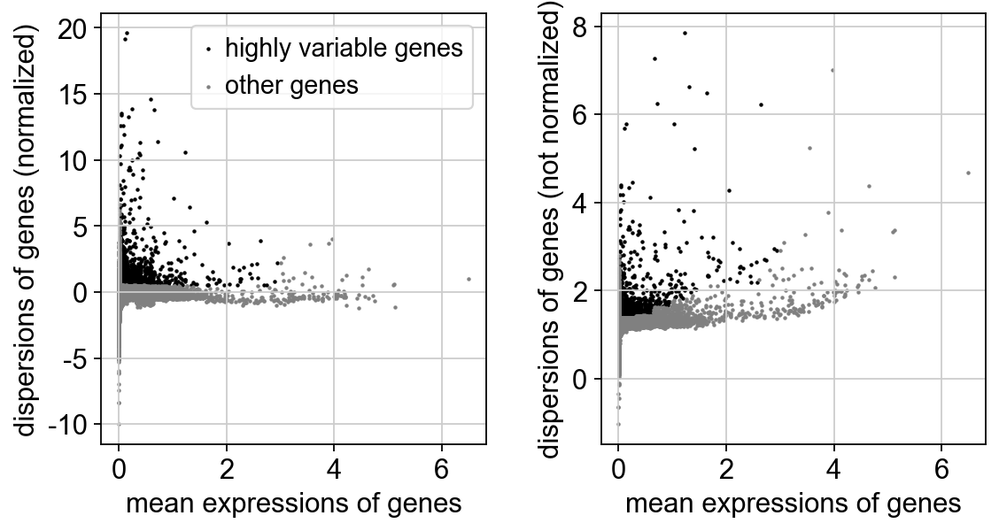

regressing out ['total_counts', 'pct_counts_mt']
    sparse input is densified and may lead to high memory use
    finished (0:00:07)
tFL1
normalizing counts per cell
    finished (0:00:00)


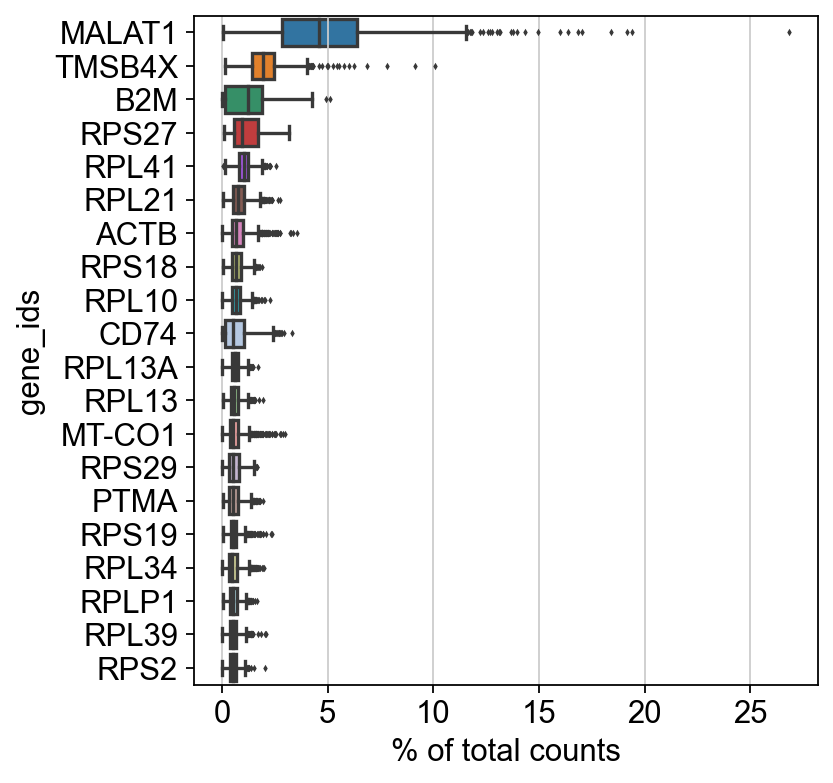

filtered out 16056 genes that are detected in less than 3 cells


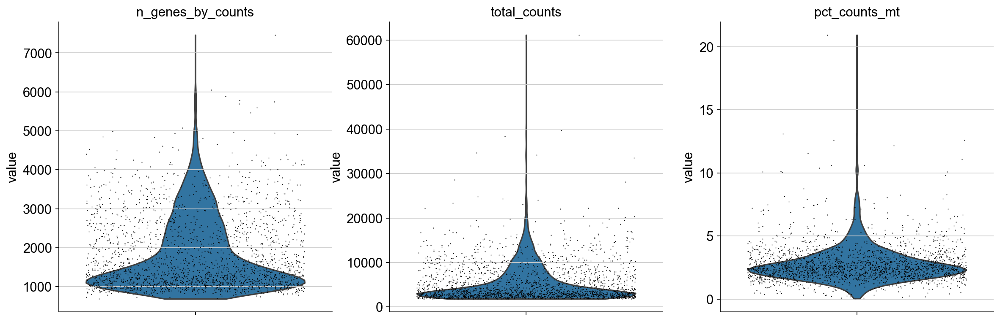

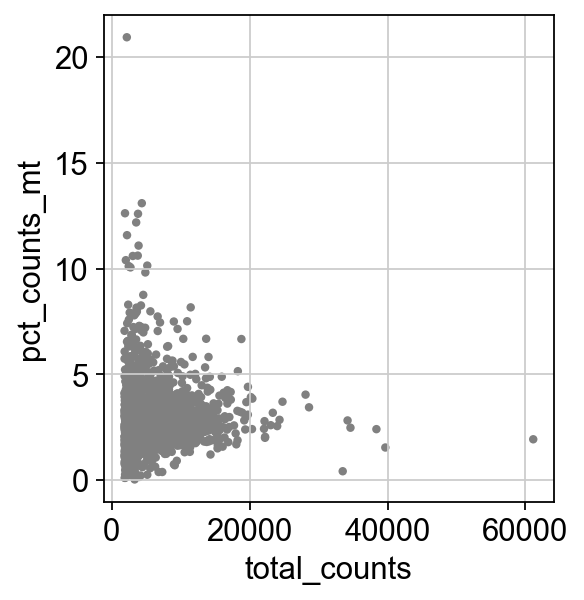

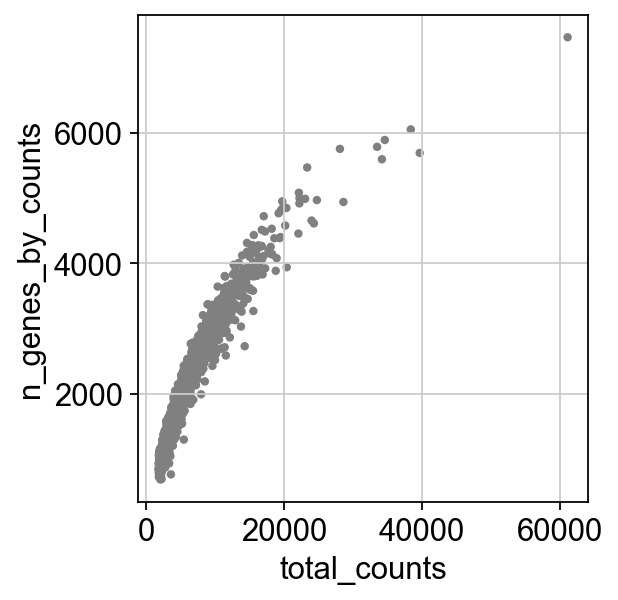

normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes


C:\Users\annes\anaconda3\envs\single_cell_env\lib\site-packages\scanpy\preprocessing\_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:00)


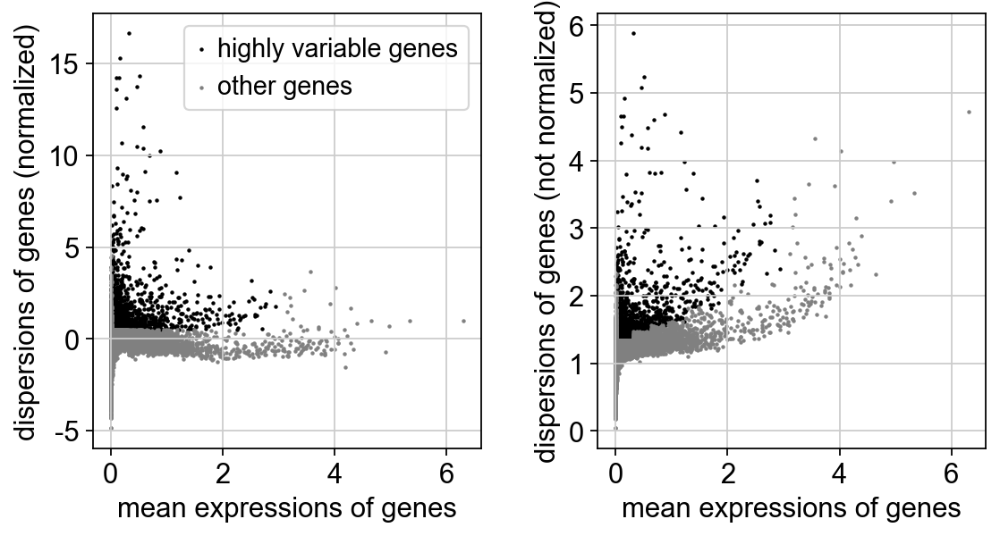

regressing out ['total_counts', 'pct_counts_mt']
    sparse input is densified and may lead to high memory use
    finished (0:00:06)
tFL2
normalizing counts per cell
    finished (0:00:00)


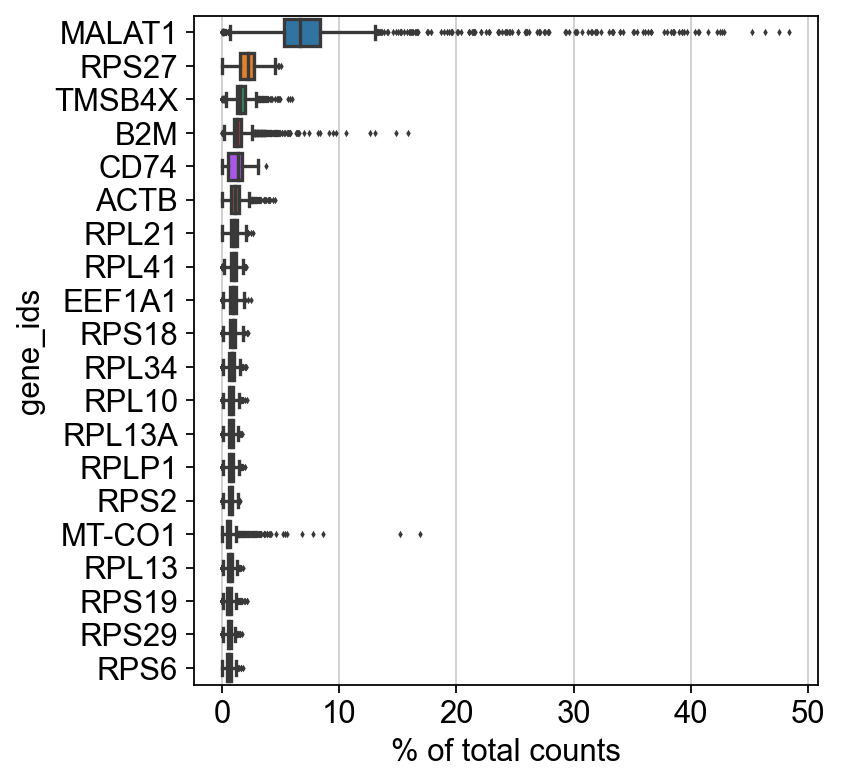

filtered out 2 cells that have less than 200 genes expressed
filtered out 17633 genes that are detected in less than 3 cells


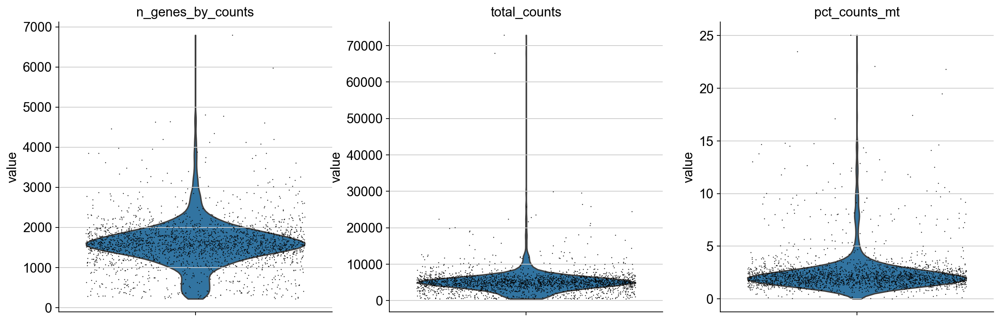

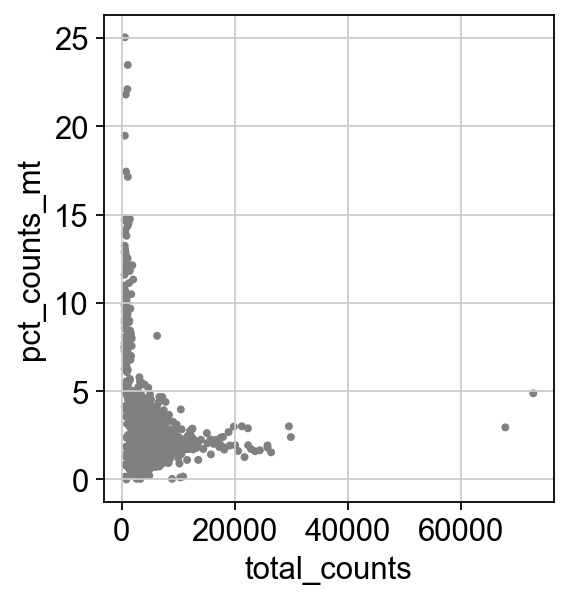

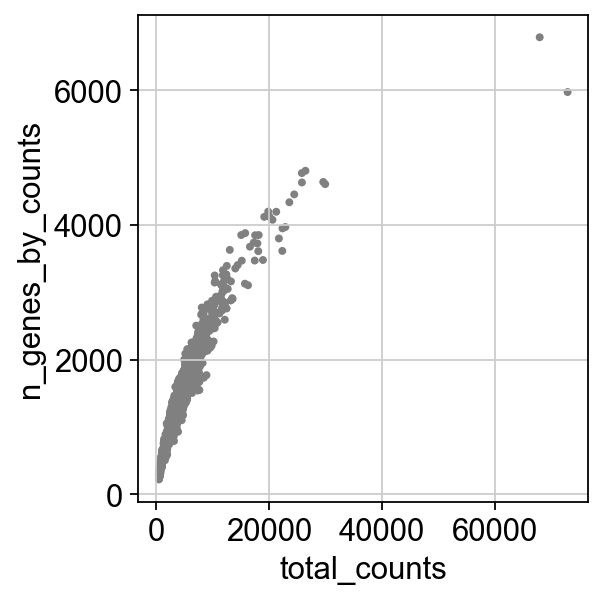

normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes


C:\Users\annes\anaconda3\envs\single_cell_env\lib\site-packages\scanpy\preprocessing\_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:00)


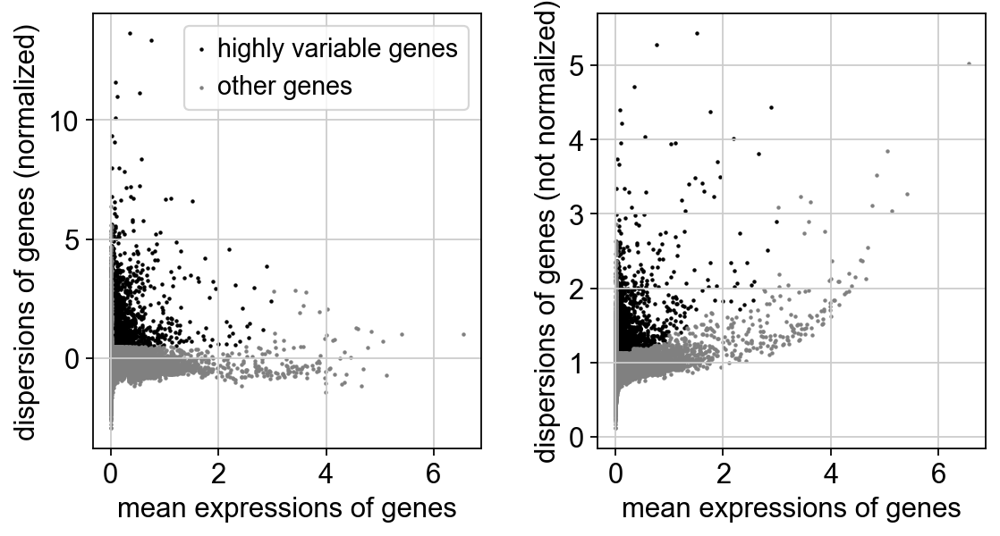

regressing out ['total_counts', 'pct_counts_mt']
    sparse input is densified and may lead to high memory use
    finished (0:00:07)


In [87]:
# I will loop the analysis run on rLN1 sample on all the 11 other samples so they are all preprocessed for future analysis
adata_FL_transformed = {}
for sample in adata_FL:
    adata = adata_FL[sample]
    adata.var_names_make_unique()
    print(sample)
    sc.pl.highest_expr_genes(adata, n_top=20, )
    sc.pp.filter_cells(adata, min_genes=200)
    sc.pp.filter_genes(adata, min_cells=3)
    # Calculate some basic metrics
    adata.var['mt'] = adata.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
    sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
    sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)
    sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
    sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')
    adata = adata[adata.obs.n_genes_by_counts < 2500, :]
    adata = adata[adata.obs.pct_counts_mt < 5, :]
    sc.pp.normalize_total(adata, target_sum=1e4)
    sc.pp.log1p(adata)
    sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
    sc.pl.highly_variable_genes(adata)
    adata.raw = adata
    adata = adata[:, adata.var.highly_variable]
    sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])
    sc.pp.scale(adata, max_value=10)
    adata_FL_transformed[sample] = adata 

In [88]:
# create a list of the Anndata object
sample_list = [adata_FL_transformed[sample] for sample in adata_FL_transformed]

In [101]:
from anndata.experimental.multi_files import AnnCollection
# Using the Anncollection class to concatenate all the Anndata to run machine learning technique on the whole dataset (12 samples)
dataset = AnnCollection(sample_list, join_vars='inner',join_obs = 'outer', join_obsm='inner', label='dataset')

C:\Users\annes\anaconda3\envs\single_cell_env\lib\site-packages\anndata\experimental\multi_files\_anncollection.py:727: UserWarning: Observation names are not unique.
  warnings.warn("Observation names are not unique.", UserWarning)


In [102]:
dataset

AnnCollection object with n_obs × n_vars = 32220 × 83
  constructed from 12 AnnData objects
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'dataset'

In [108]:
# Transform the Anncollection into Anndata
adata_dataset = dataset.to_adata()

C:\Users\annes\anaconda3\envs\single_cell_env\lib\site-packages\anndata\_core\anndata.py:1838: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [109]:
adata_dataset

AnnData object with n_obs × n_vars = 32220 × 83
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'dataset'
    obsm: 'X_pca'

In [110]:
adata_dataset.var

""
gene_ids
ISG15
TNFRSF18
TNFRSF4
TNFRSF9
TNFRSF1B
...
GZMM
TYROBP
NKG7


In [154]:
# out of curiosity I run the Louvain algorithm and UMAP on the whole dataset
# This cell takes 47 min to run
sc.pp.neighbors(adata_dataset, n_neighbors=3000, n_pcs=40)

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished (0:47:03)


In [194]:
# This cell takes 18 hours to run
sc.tl.umap(adata_dataset)

computing UMAP
    finished (18:34:43)


In [195]:
adata_dataset.var_names

Index(['ISG15', 'TNFRSF18', 'TNFRSF4', 'TNFRSF9', 'TNFRSF1B', 'ID3', 'STMN1',
       'IFI6', 'GADD45A', 'GBP2', 'CD2', 'C1orf56', 'S100A4', 'LMNA', 'FCER1G',
       'RGS2', 'LYST', 'ID2', 'RRM2', 'ZFP36L2', 'GNLY', 'CD8A', 'CD8B',
       'AC133644.2', 'DUSP2', 'MIR4435-2HG', 'ICOS', 'PASK', 'CMC1', 'TIGIT',
       'GPR171', 'JCHAIN', 'IL7R', 'GZMA', 'EGR1', 'CD83', 'HIST1H1C', 'TNF',
       'AIF1', 'TNFAIP3', 'CITED2', 'ICA1', 'TRGC2', 'TRBC1', 'GIMAP4',
       'MAGEH1', 'CXCR3', 'SH2D1A', 'ANXA1', 'GADD45G', 'NUCB2', 'MS4A6A',
       'RARRES3', 'CTSW', 'CTSC', 'BIRC3', 'JAML', 'CRTAM', 'IL2RA', 'PRF1',
       'DDIT4', 'KLRB1', 'IFNG', 'PHLDA1', 'DUSP6', 'RGCC', 'GPR183', 'GZMB',
       'BATF', 'IL32', 'MT2A', 'MAF', 'CCL5', 'CCL3', 'CCL4', 'CD7', 'CST7',
       'ID1', 'GZMM', 'TYROBP', 'NKG7', 'MYADM', 'LGALS1'],
      dtype='object', name='gene_ids')

C:\Users\annes\anaconda3\envs\single_cell_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


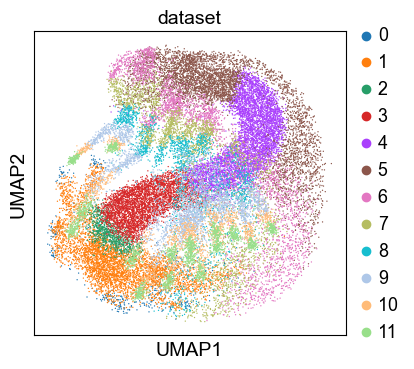

In [196]:
sc.pl.umap(adata_dataset, color = ['dataset']) 
           # color=['IL7R', 'CD83', 'CD8A', 'CD8B', 'CXCR3'])

In [151]:
adata_FL.keys()

dict_keys(['DLBCL1', 'DLBCL2', 'DLBCL3', 'FL1', 'FL2', 'FL3', 'FL4', 'rLN1', 'rLN2', 'rLN3', 'tFL1', 'tFL2'])

In [152]:
sc.tl.leiden(adata_dataset)

running Leiden clustering
    finished (0:01:04)


C:\Users\annes\anaconda3\envs\single_cell_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
C:\Users\annes\anaconda3\envs\single_cell_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


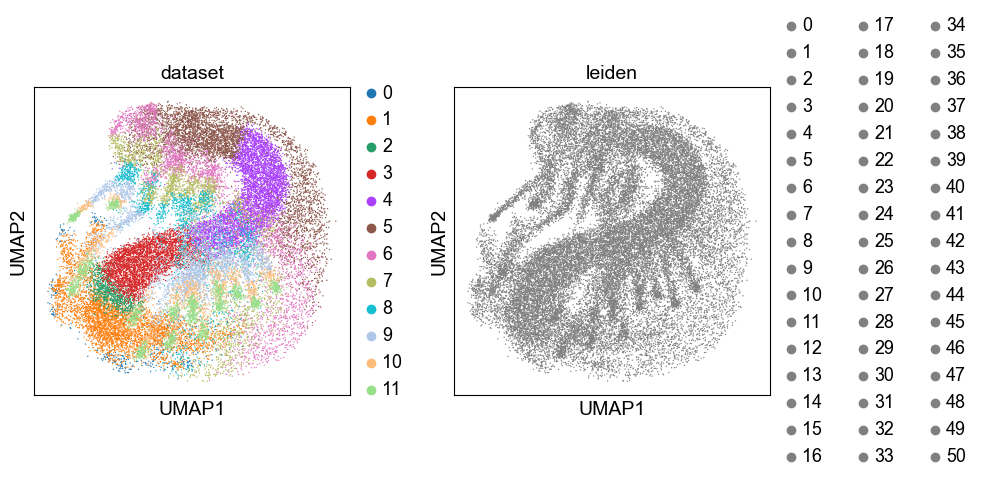

In [197]:
# in this graph the name of the dataset is not preserved. For better readability Iwill try to correct this.
sc.pl.umap(adata_dataset, color =['dataset', 'leiden'])

Those results show that analyzing the clustering with whole samples is quite tricky. I will run the Louvain algorithm and UMAP on two samples to evaluate the technique.

## Integrating two samples

In [175]:
adata_ref = rLN1_adata
adata_2 = adata_FL_transformed['rLN2']
adata_3 = adata_FL_transformed['rLN3']

In [178]:
var_names = adata_ref.var_names.intersection(adata.var_names)
adata_ref = adata_ref[:, var_names]
adata_2 = adata_2[:, var_names]
adata_3 = adata_3[:, var_names]

The model and graph (here PCA, neighbors, UMAP) trained on the reference data will explain the biological variation observed within it.

In [179]:
sc.pp.pca(adata_ref)
sc.pp.neighbors(adata_ref)
sc.tl.umap(adata_ref)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished (0:00:00)
computing UMAP
    finished (0:00:07)


C:\Users\annes\anaconda3\envs\single_cell_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


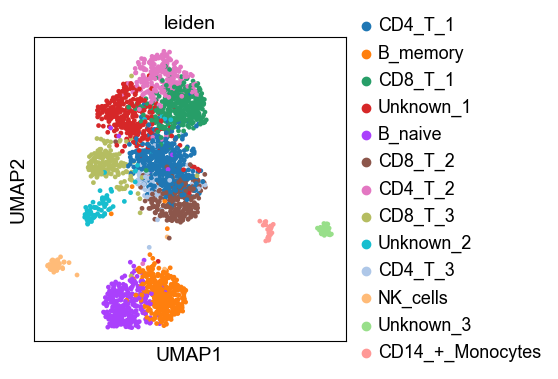

<Figure size 200x200 with 0 Axes>

In [190]:
sc.pl.umap(adata_ref, color='leiden')

In [181]:
sc.tl.ingest(adata_2, adata_ref, obs='leiden')

running ingest


C:\Users\annes\anaconda3\envs\single_cell_env\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


    finished (0:00:12)


In [182]:
adata_2.uns['leiden_colors'] = adata_ref.uns['leiden_colors'] 

C:\Users\annes\anaconda3\envs\single_cell_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


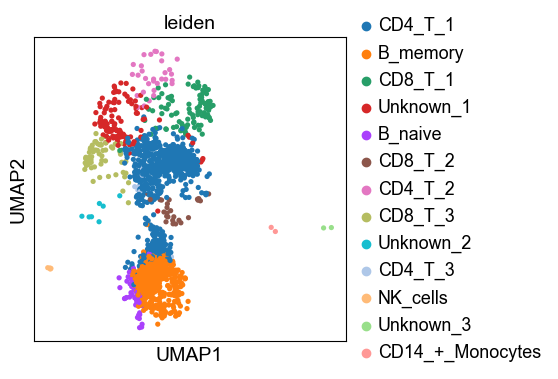

In [183]:
sc.pl.umap(adata_2, color='leiden', wspace=0.5)

C:\Users\annes\anaconda3\envs\single_cell_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


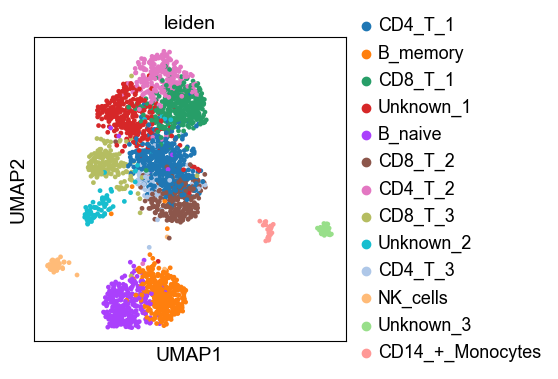

In [184]:
sc.pl.umap(adata_ref, color='leiden', wspace=0.5)

We can see that the method did not change the initial clustering when we used only one sample.

In [185]:
# Concatenate the two anndata together
adata_concat = adata_ref.concatenate(adata_2, batch_categories=['ref', 'new'])

C:\Users\annes\anaconda3\envs\single_cell_env\lib\site-packages\anndata\_core\anndata.py:1763: FutureWarning: The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  warnings.warn(


In [186]:
adata_concat.obs.leiden = adata_concat.obs.leiden.astype('category')
adata_concat.obs.leiden.cat.reorder_categories(adata_ref.obs.leiden.cat.categories)  # fix category ordering
adata_concat.uns['leiden_colors'] = adata_ref.uns['leiden_colors']  # fix category colors

C:\Users\annes\anaconda3\envs\single_cell_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
C:\Users\annes\anaconda3\envs\single_cell_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


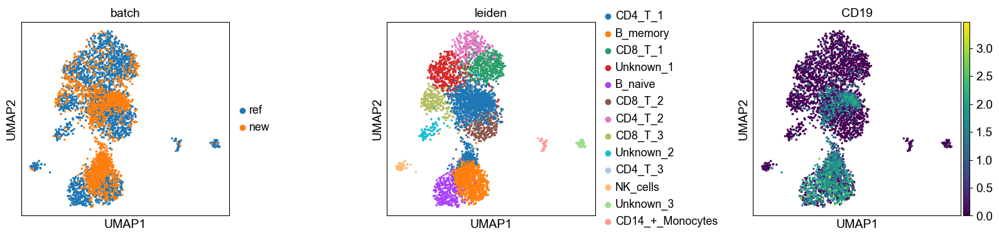

<Figure size 200x200 with 0 Axes>

In [191]:
sc.pl.umap(adata_concat, color=['batch', 'leiden', 'CD19'], wspace = 0.6)
plt.savefig('Leiden_clusters_UMAP_batch_effect_rLN1_2')

From the results above, we can see some batch effects, as the CD19 seen in the upper cluster should not be there but lower within clusters 1 and 4. So, for the near future of the project, I will focus on using machine learning to correct this batch effect only using the rLN samples = non-malignant and well more already described (total of 3 samples).
To do so, I will first try to change some hyperparameters of the technique currently used (number of components, number of neighbors, components from PCA, etc.).
I will look into other clustering algorithms (or community detection algorithms).
I will implement and compare a neural network with an already-developed neural network called SCALEX.
I will also introduce some metrics to compare the performance of different algorithms (instead of relying on identifying known clusters).
If I can fix the batch effect, I will cluster the whole dataset and get some biological insight.